# 20 vs 20 signal processing

Pipeline for the input files:
* Remove duplicates from BAM files
* Call peaks
* Launch script `scripts/peaks_signal.sh`

The alternative way:
```
wget https://teamcity.jetbrains.com/repository/download/Epigenome_Pipeline/.lastPinned/pipeline-dev.jar?guest=1 -O pipeline-dev.jar

java -XX:+HeapDumpOnOutOfMemoryError -Xmx256m -cp pipeline-dev.jar org.jetbrains.bio.experiments.histones.ChipseqAnalysisPipeline /scratch/artyomov_lab_aging/Y20O20/chipseq/processed/Y20O20.yaml --washu /home/oshpynov/work/washu  --dir $(pwd) | tee log.txt
```

In [1]:
# Configure
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from IPython.core.display import display
# Actually we don't use, just for fancy styling
import seaborn as sns

/Users/oleg/miniconda3/lib/python3.5/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


# Peaks distribution

In [2]:
# Load Bed python code
%run ~/work/washu/bed/bedtrace.py
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import re

def intersect_peaks(YDS, ODS):
    YD_intersection = intersect(*YDS.values())
    OD_intersection = intersect(*ODS.values())
    YD_OD_intersection = intersect(YD_intersection, OD_intersection)
    metapeaks({'Young donors': YD_intersection, 'Old donors': OD_intersection})
    plt.show()
   
    N = len(YDS) + len(ODS)
    ind=np.arange(N)

    common_peaks = [YD_OD_intersection.count()] * N 
    group_specific = [YD_intersection.count() - YD_OD_intersection.count()] * len(YDS) +\
                    [OD_intersection.count() - YD_OD_intersection.count()] * len(ODS)
    sample_specific = []
    names = []
    for k, v in YDS.items():
        sample_specific.append(v.count() - YD_intersection.count())
        names.append(k)
    for k, v in ODS.items():
        sample_specific.append(v.count() - OD_intersection.count())
        names.append(k)
    
    plt.figure(figsize=(15,15))
    width=0.35
    p1 = plt.bar(ind, common_peaks, width, color='green')
    p2 = plt.bar(ind, group_specific, width, bottom=common_peaks, color='blue')
    p3 = plt.bar(ind, sample_specific, width, bottom=np.sum([common_peaks,group_specific], axis=0), color='red')
    plt.ylabel('Peaks')
    plt.xticks(ind, names)
    plt.legend((p1[0], p2[0], p3[0]), ('Common', 'Group', 'Individual'))
    plt.show()


def peaks(folder, chromsizes):
    files = os.listdir(folder)
    ods = {re.findall('OD\\d+', f)[0]: Bed(folder + '/' + f) for f in files 
           if re.match('.*OD\\d+.*\.bed$', f) and not re.match('.*input.*', f)}
    yds = {re.findall('YD\\d+', f)[0]: Bed(folder + '/' + f) for f in files 
           if re.match('.*YD\\d+.*\.bed$', f) and not re.match('.*input.*', f)}
    intersect_peaks(yds, ods)

# Peaks ZINBRA

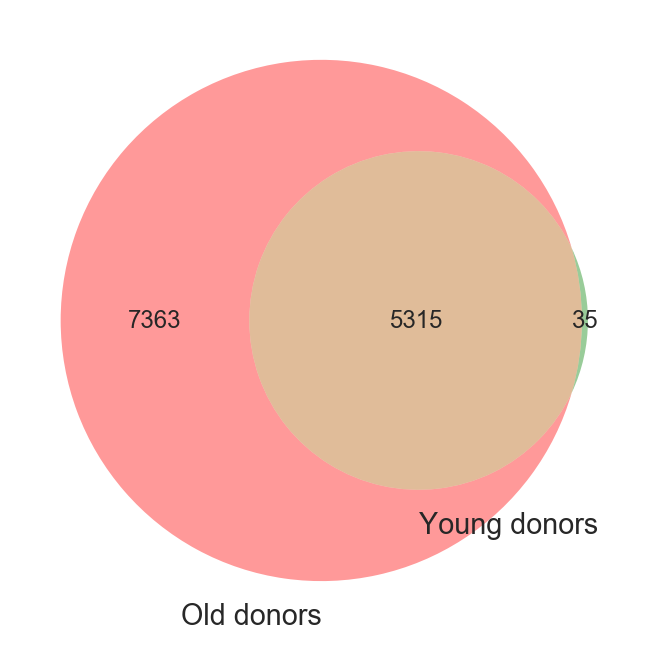

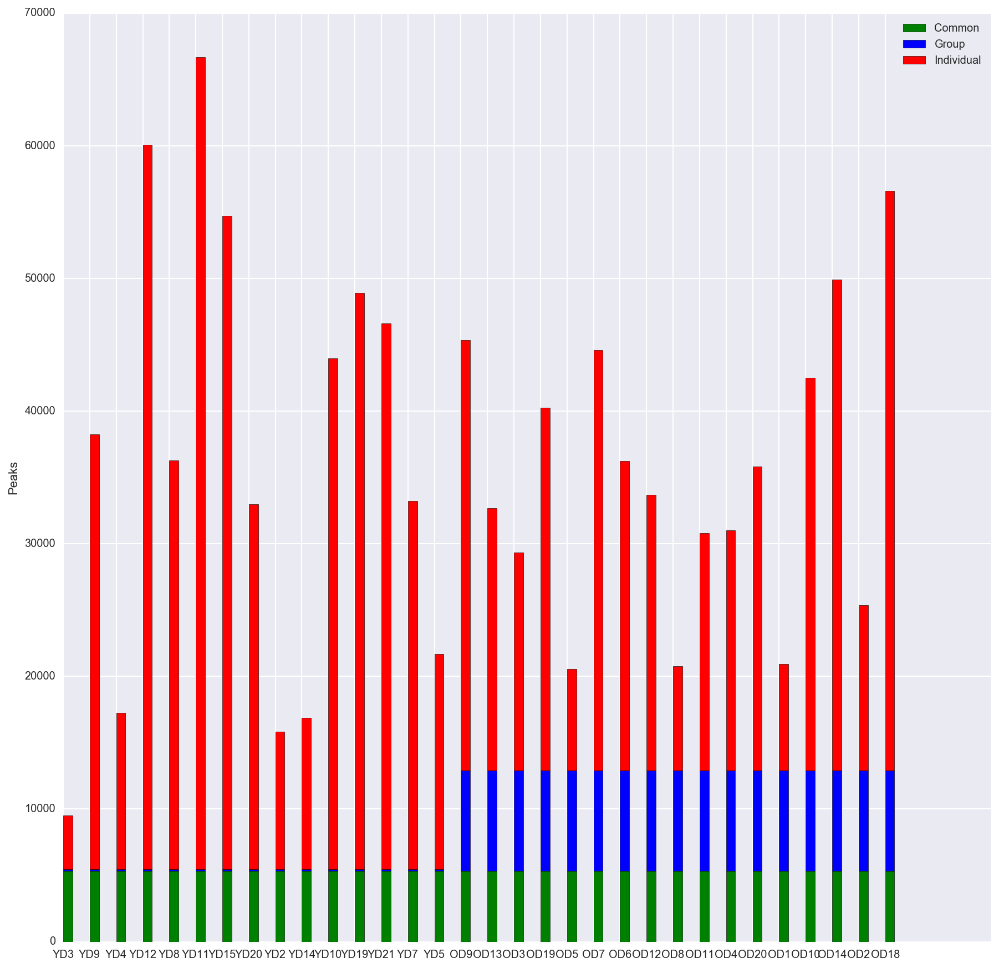

In [3]:
peaks('/mnt/stripe/bio/experiments/configs/Y20O20/peaks/H3K27ac')

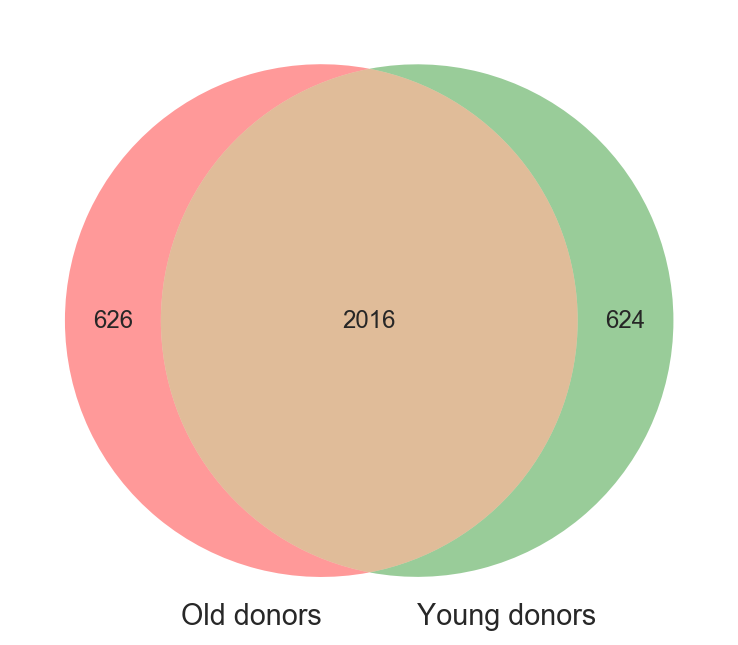

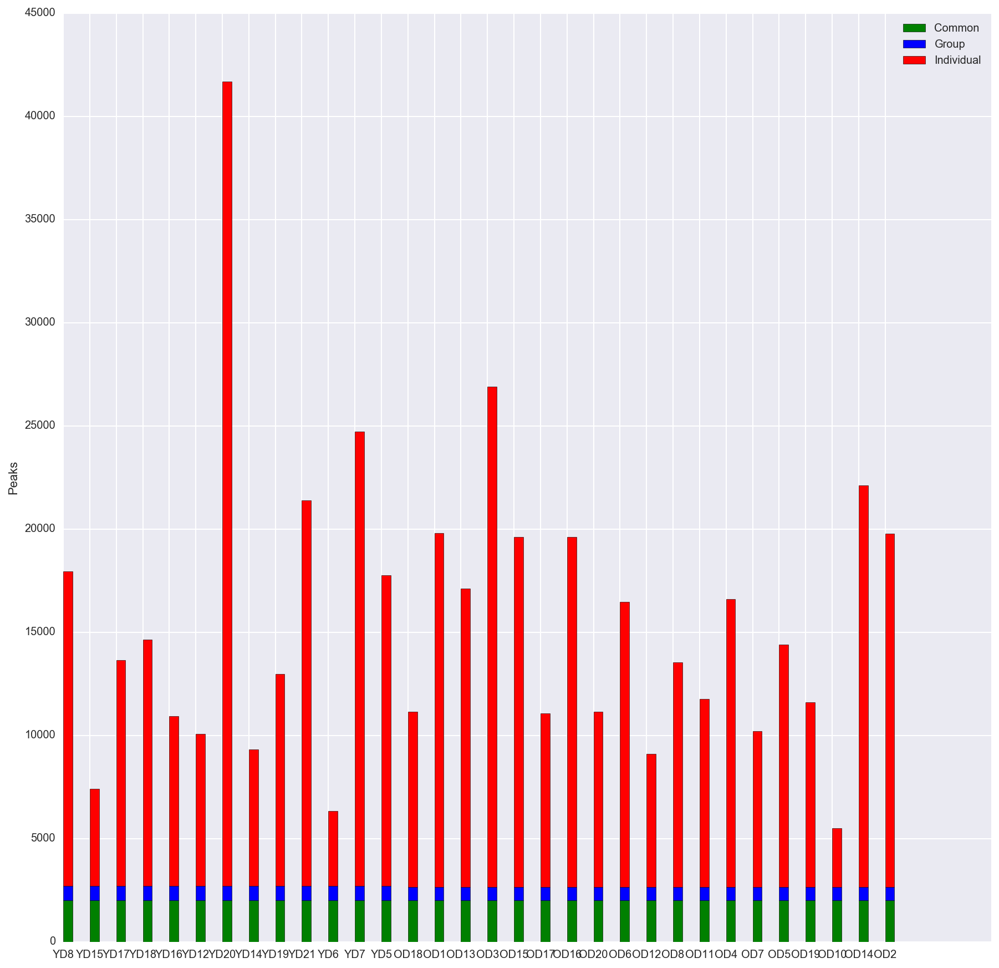

In [4]:
peaks('/mnt/stripe/bio/experiments/configs/Y20O20/peaks/H3K27me3')

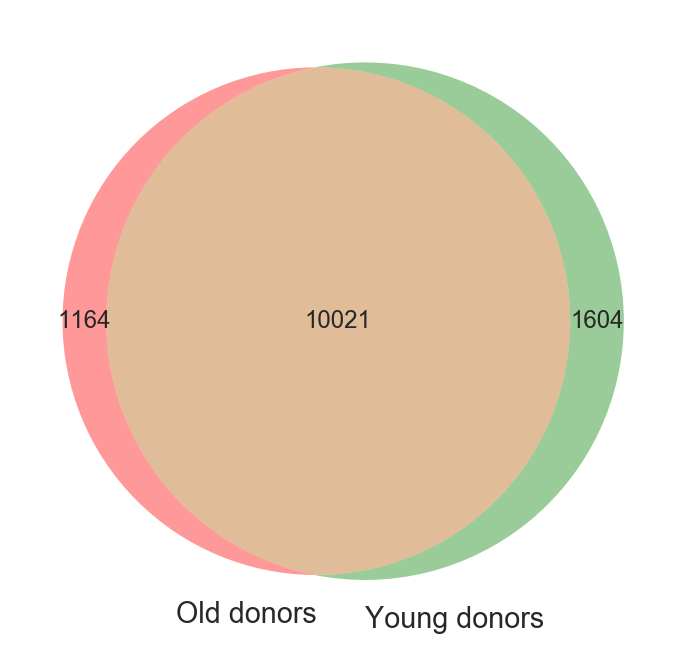

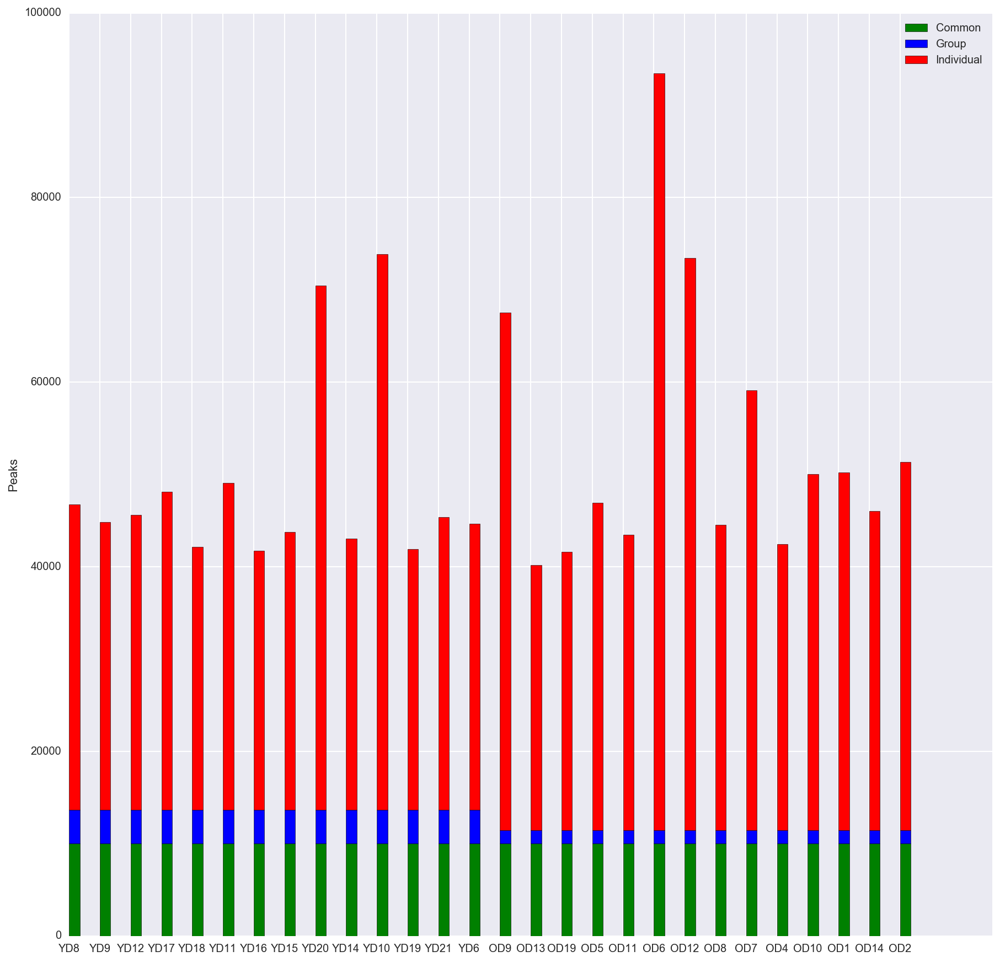

In [5]:
peaks('/mnt/stripe/bio/experiments/configs/Y20O20/peaks/H3K36me3')

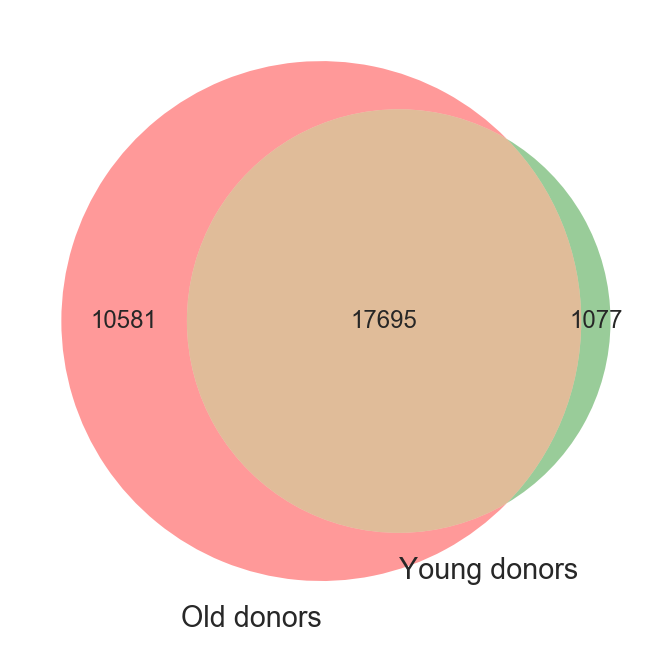

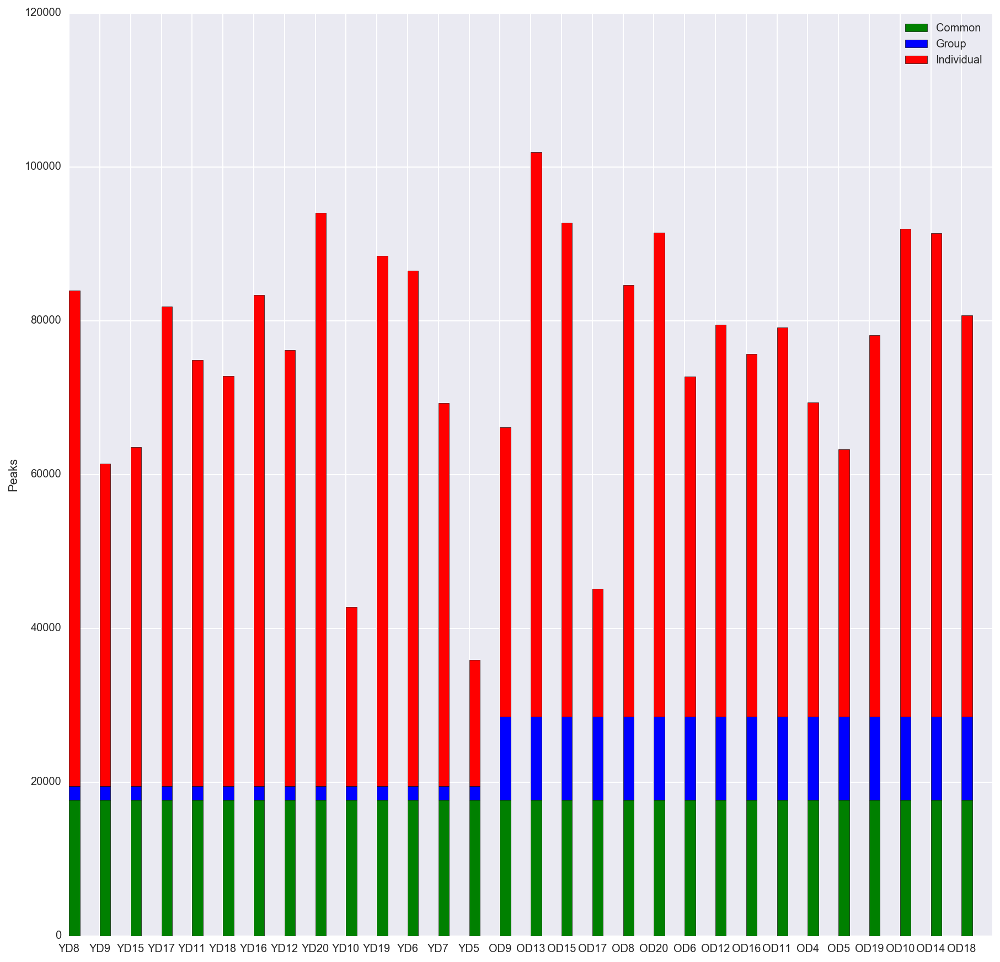

In [6]:
peaks('/mnt/stripe/bio/experiments/configs/Y20O20/peaks/H3K4me1')

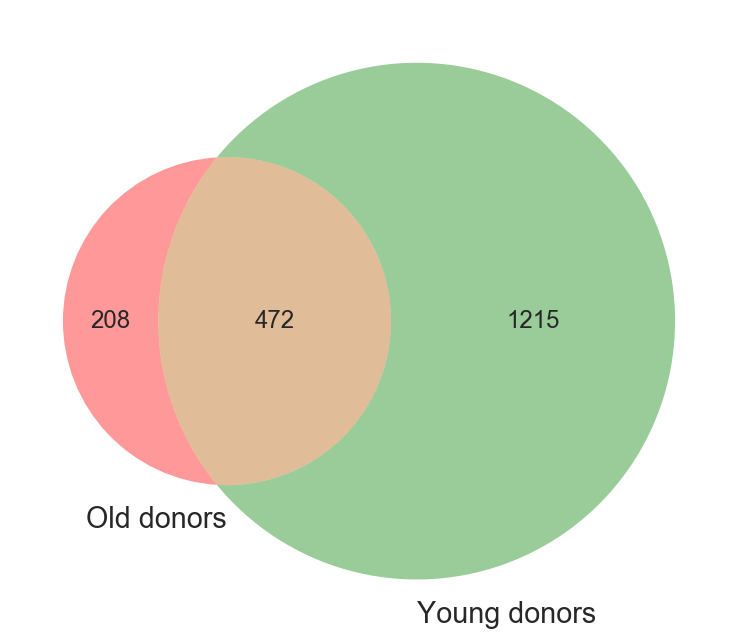

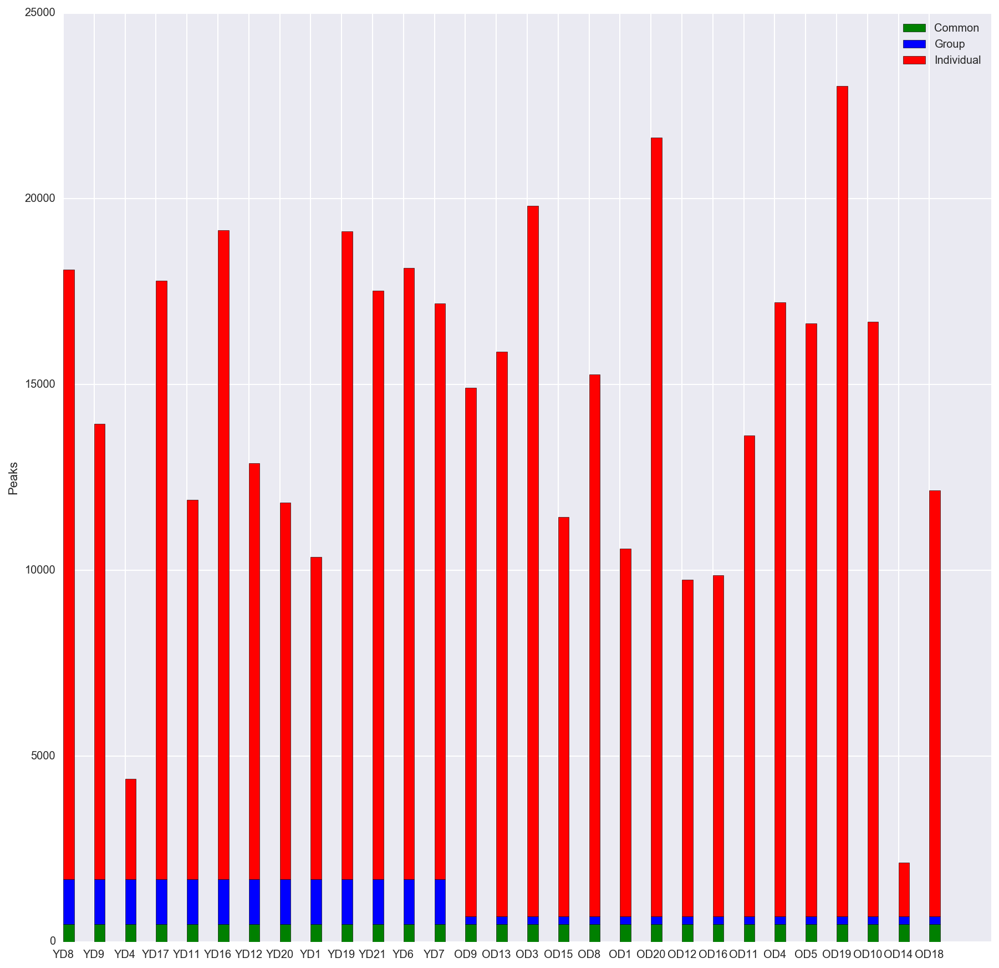

In [7]:
peaks('/mnt/stripe/bio/experiments/configs/Y20O20/peaks/H3K4me3')

# Signal in peaks distribution

In [2]:
# PCA plots

from enum import Enum
from collections import namedtuple
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn import preprocessing

import re


class Normalization(Enum):
    NONE = 1
    SCALED = 3
    SUM = 2

Group = namedtuple('Group', 'name color prefix')
OD_GROUP = Group('OD', 'blue', '')
YD_GROUP = Group('YD', 'red', '')
def od_yd_groupf(x):
    if x.startswith('OD'):
        return OD_GROUP
    return YD_GROUP


def signal_pca(x0, 
               title, 
               groups=None,
               scale=Normalization.NONE):
    if groups is None:
        groups = [od_yd_groupf(n) for n in x0.index]
    x = x0
    if scale == Normalization.SCALED:
        x = preprocessing.scale(x0)
    if scale == Normalization.SUM:
        t = x.T
        for d in t.columns:
            t[d] = t[d] / (sum(t[d]) / 1000000)
        x = t.T

    pca = PCA(n_components=2)
    x_r = pca.fit_transform(x)
    for g in set(groups):
        gfilter = np.asarray([g == n for n in groups])
        plt.scatter(x_r[gfilter, 0], x_r[gfilter, 1] , color=g.color, alpha=.8, label=g.name)

    for g, label, x, y in zip(groups, 
                              [re.sub('YD_|OD_|H3K27ac|H3K27me3|H3K36me3|H3K4me1|H3K4me3|unique|_', '', n) for n in x0.index], 
                              x_r[:, 0], x_r[:, 1]):
        plt.annotate(g.prefix + label, xy=(x, y), xytext=(0, 0), textcoords='offset points', ha='right', va='bottom')
    plt.title('{} [{}, {}]'.format(title, pca.explained_variance_ratio_[0], pca.explained_variance_ratio_[1]))


def signal_pca_log(x, title, groups=None):
    plt.figure(figsize=(10, 5))
    plt.subplot(1,2,1)
    signal_pca(x, title, groups=groups)
    plt.subplot(1,2,2)
    signal_pca(np.log1p(x), 'LOG {}'.format(title), groups=groups)
    plt.show()
    

def signal_pca_all(x, title, groups=None):
    '''Plot all the scaled variants of PCA'''
    plt.figure(figsize=(15, 10))
    plt.subplot(2,3,1)
    signal_pca(x, title, groups=groups)
    plt.subplot(2,3,4)
    signal_pca(np.log1p(x), 'LOG {}'.format(title), groups=groups)
    plt.subplot(2,3,2)
    signal_pca(x, 'SCALED {}'.format(title), scale=Normalization.SCALED, groups=groups)
    plt.subplot(2,3,5)
    signal_pca(np.log1p(x), 'LOG SCALED {}'.format(title), scale=Normalization.SCALED, groups=groups)
    plt.subplot(2,3,3)
    signal_pca(x, 'SUM {}'.format(title), scale=Normalization.SUM, groups=groups)
    plt.subplot(2,3,6)
    signal_pca(np.log1p(x), 'LOG SUM {}'.format(title), scale=Normalization.SUM, groups=groups)
    plt.show()

## DiffBind score processing

In [3]:
import subprocess
import math
import tempfile

# See documents on how to compute scores
# https://docs.google.com/document/d/1zH5cw5Zal546xkoFFCVqhhYmf3742efhddz5cqpD9PQ/edit?usp=sharing
def score(cond, cont, scale):
    if scale > 1:
        scale = 1
    if scale != 0:
        cont = math.ceil(cont * scale)
    # According to pv.get_reads() function, if reads number is < 1 than it should be 1
    return max(1, cond - cont)

def process_scores(df, sizes, records):
    scores_processed = pd.DataFrame()
    sizes_processed = pd.DataFrame(columns=['name', 'size'])
    for cond, cont, g in records:
        scale = sizes.loc[cond]['size'] / sizes.loc[cont]['size']
        if g is None:
            prefix = ''
        else:
            prefix= g.prefix
        scores_processed[prefix + cond] = [score(z[0], z[1], scale) for z in zip(df[cond], df[cont])]
        sizes_processed.loc[len(sizes_processed)] = (prefix + cond, sizes.loc[cond]['size'])
        print(prefix + cond, 'size', sizes.loc[cond]['size'], cont, 'size', sizes.loc[cont]['size'], 'scale', scale)
    return scores_processed, sizes_processed


def process(records, df, sizes, ods, yds):
    if records[0][2] is not None:
        groups = [p[2] for p in records]
    else:
        groups = None
    scores, libsizes = process_scores(df, sizes, records)
    signal_pca_all(scores.T, 'Scores', groups=groups)

    print('TMM normalization')
    scores_tmpfile = tempfile.NamedTemporaryFile(prefix='scores', suffix='.tsv').name
    scores.to_csv(scores_tmpfile, index=False, sep='\t')
    print('Saved scores to', scores_tmpfile)
    resultfile=scores_tmpfile.replace('.tsv', '_tmm.tsv')
    
    sizes_tmpfile = tempfile.NamedTemporaryFile(prefix='sizes', suffix='.tsv').name
    libsizes.to_csv(sizes_tmpfile, index=False, sep='\t', header=None)
    print('Saved sizes to', sizes_tmpfile)
    
    print('TMM normalization using R')
    cmd="Rscript /home/oleg/work/washu/R/tmm.R " + scores_tmpfile + " " + sizes_tmpfile + " " + resultfile
    print(cmd)
    subprocess.run(cmd,  shell=True)

    # Difference between DBA_SCORE_TMM_MINUS_FULL and DBA_SCORE_TMM_MINUS_FULL_CPM is in bCMP
    print('TMM Scores DBA_SCORE_TMM_MINUS_FULL_CPM')
    scores_tmm = pd.read_csv(resultfile, sep='\t') * 10000000
    display(scores_tmm.head())
    signal_pca_log(scores_tmm.T, 'TMM Scores DBA_SCORE_TMM_MINUS_FULL_CPM', groups=groups)

    print('TMM Scores DBA_SCORE_TMM_MINUS_FULL')
    # counts <- counts * mean(res$samples$lib.size)
    signal_pca_log(scores_tmm.T * sizes.loc[ods+yds]['size'].mean(), 'TMM Scores DBA_SCORE_TMM_MINUS_FULL', 
                   groups=groups)

    return(scores_tmm)

# PCA and Diffbind normalization

In [4]:
def pca_and_diffbind(folder, name):
    print('Processing signal data')
    file=folder + '/signal/{0}/coverages_150/peaks/peaks_{1}.tsv'
    for type in ['raw', 'rpm', 'rpkm', 'rpm_peaks']:
        f = file.format(name, type)
        print(f)
        df = pd.read_csv(f, sep='\t')
        signal = df.drop(['chr', 'start', 'end', 'OD_input_unique', 'YD_input_unique'], axis=1).T
        signal_pca_all(signal, type)

    print('Processing diffbind normalization')
    file=folder + '/signal/{0}/coverages_150/peaks/peaks_raw.tsv'.format(name)
    df = pd.read_csv(file, sep='\t')
    ods=[c for c in df.columns if re.match('.*OD\\d+.*', c) and not re.match('.*input.*', c)]
    yds=[c for c in df.columns if re.match('.*YD\\d+.*', c) and not re.match('.*input.*', c)]

    sizes = folder + '/signal/{0}/tags_150/sizes.tsv'.format(name)
    sizesdf = pd.read_csv(sizes, sep='\t', names=('name', 'size'))
    sizesdf.index = sizesdf['name']
    sizesdf = sizesdf.drop('name', axis=1)
    sizesdf['size'] = sizesdf['size'] / 1000000

    records = [(d, 'OD_input_unique', OD_GROUP) for d in ods ] + [(d, 'YD_input_unique', YD_GROUP) for d in yds ]
    scores_tmm = process(records, df, sizesdf, ods, yds)

# Results

Processing signal data
/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K27ac/coverages_150/peaks/peaks_raw.tsv


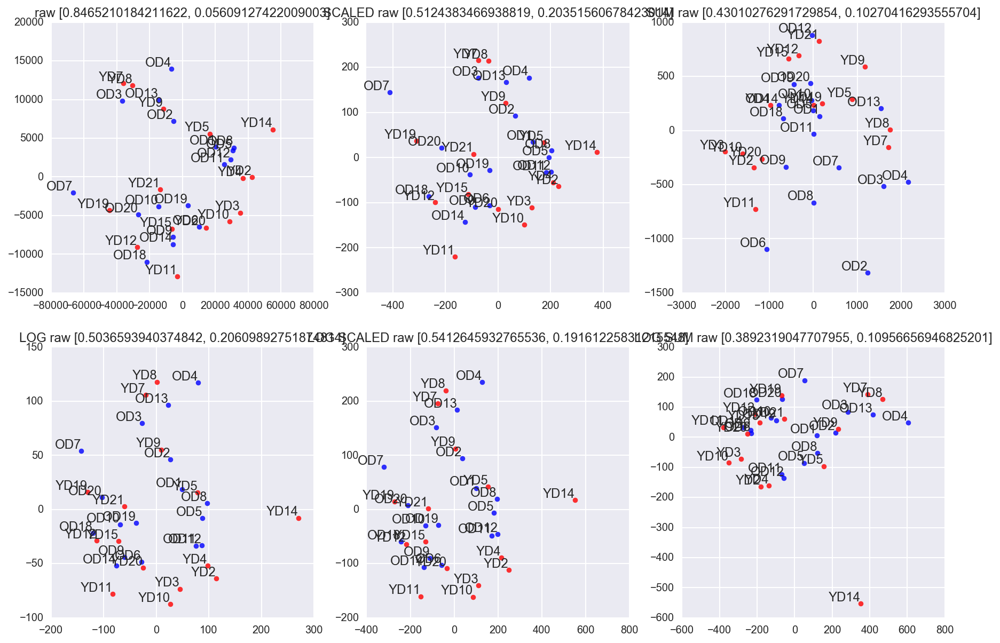

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K27ac/coverages_150/peaks/peaks_rpm.tsv


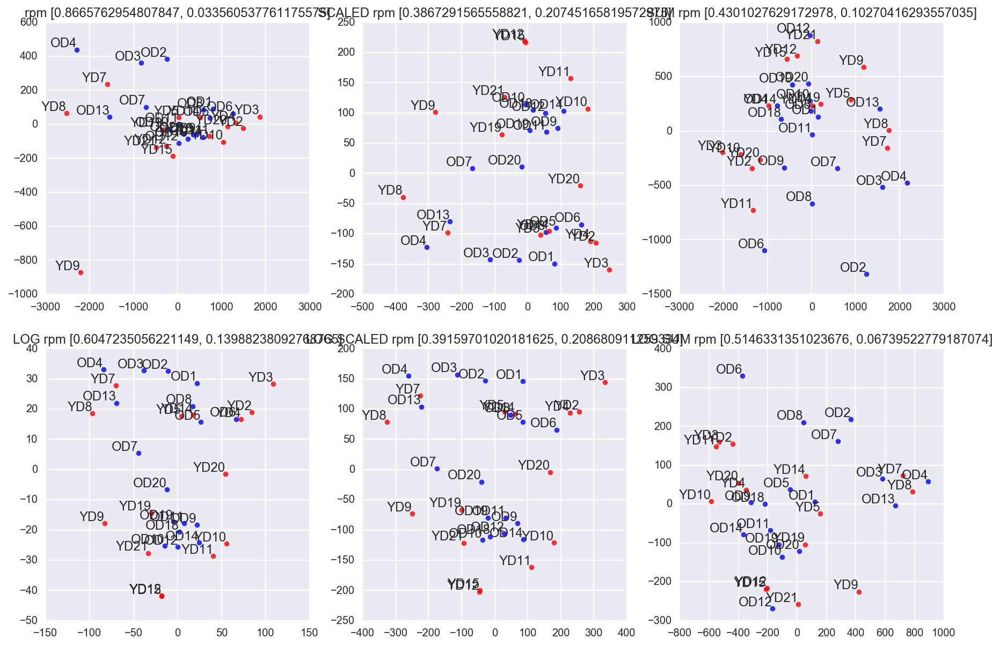

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K27ac/coverages_150/peaks/peaks_rpkm.tsv


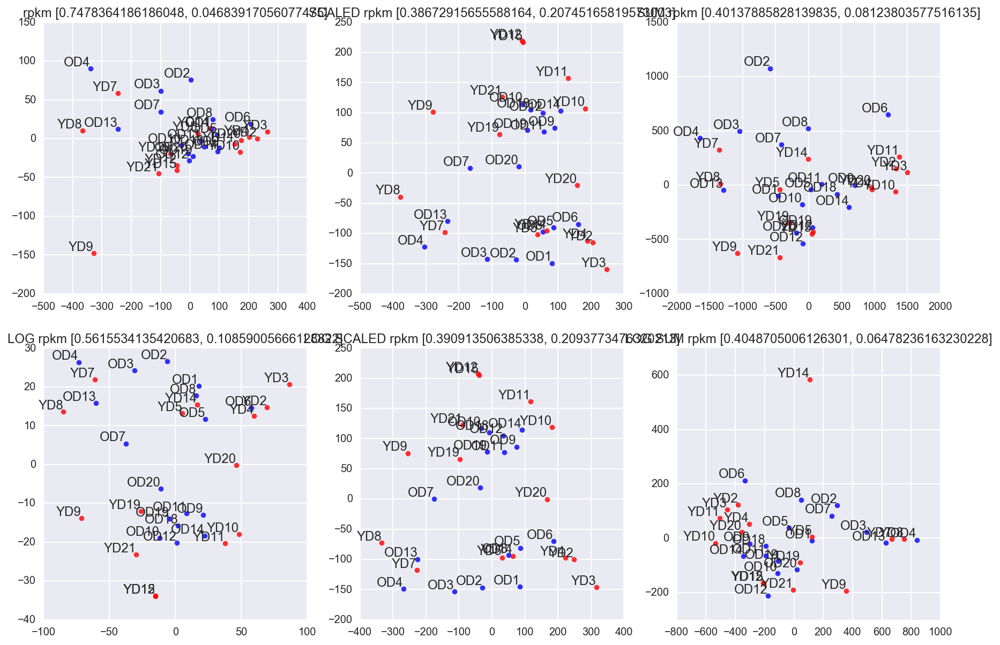

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K27ac/coverages_150/peaks/peaks_rpm_peaks.tsv


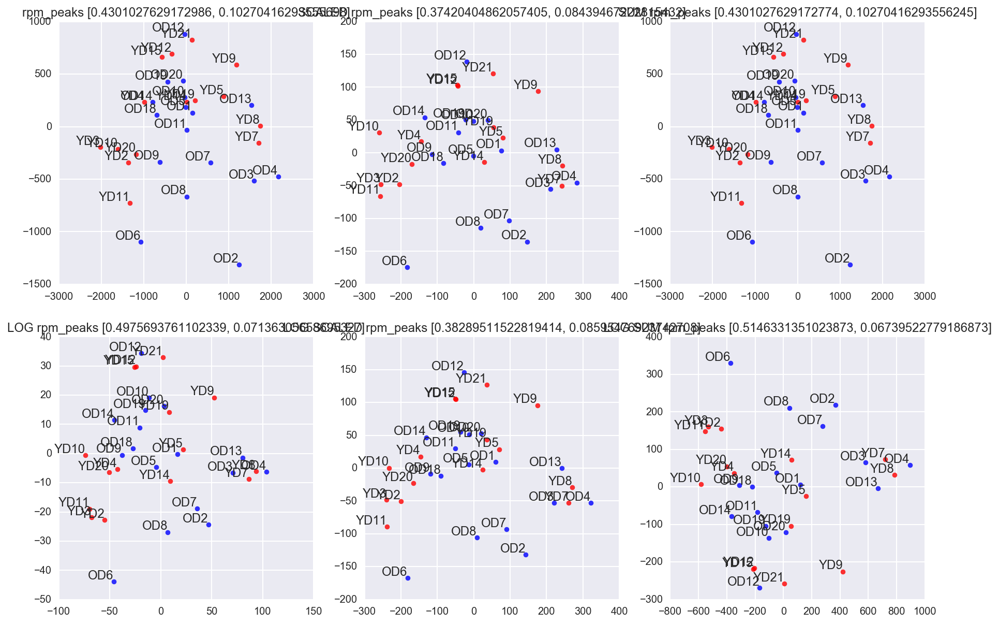

Processing diffbind normalization
OD_OD10_H3K27ac_unique size 28.874619 OD_input_unique size 39.506076 scale 0.730890585033
OD_OD11_H3K27ac_unique size 17.849066 OD_input_unique size 39.506076 scale 0.451805590613
OD_OD12_H3K27ac_unique size 16.57266 OD_input_unique size 39.506076 scale 0.419496484541
OD_OD13_H3K27ac_unique size 20.705243 OD_input_unique size 39.506076 scale 0.524102748144
OD_OD14_H3K27ac_unique size 34.208306 OD_input_unique size 39.506076 scale 0.865899868162
OD_OD18_H3K27ac_unique size 36.976853 OD_input_unique size 39.506076 scale 0.935978885881
OD_OD19_H3K27ac_unique size 26.904729 OD_input_unique size 39.506076 scale 0.681027622181
OD_OD1_H3K27ac_unique size 26.719384 OD_input_unique size 39.506076 scale 0.676336065369
OD_OD20_H3K27ac_unique size 36.325735 OD_input_unique size 39.506076 scale 0.919497421106
OD_OD2_H3K27ac_unique size 25.93842 OD_input_unique size 39.506076 scale 0.656567865662
OD_OD3_H3K27ac_unique size 30.051611 OD_input_unique size 39.506076 sc

/Users/oleg/miniconda3/lib/python3.5/site-packages/sklearn/preprocessing/data.py:184: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


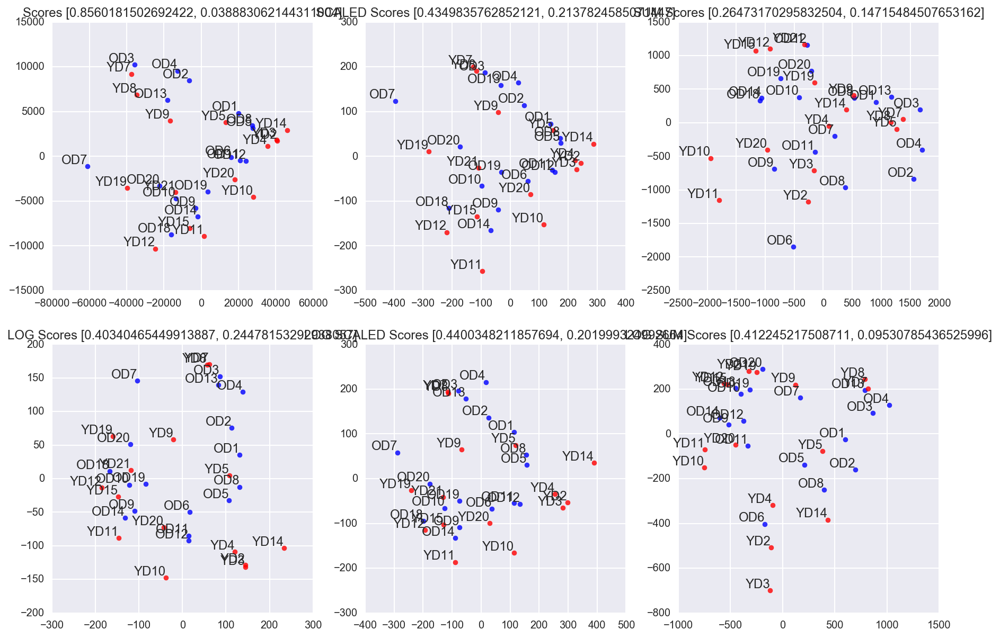

TMM normalization
Saved scores to /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scoresbdr6besz.tsv
Saved sizes to /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/sizesi91x1f64.tsv
TMM normalization using R
Rscript /home/oleg/work/washu/R/tmm.R /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scoresbdr6besz.tsv /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/sizesi91x1f64.tsv /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scoresbdr6besz_tmm.tsv
TMM Scores DBA_SCORE_TMM_MINUS_FULL_CPM


,OD_OD10_H3K27ac_unique,OD_OD11_H3K27ac_unique,OD_OD12_H3K27ac_unique,OD_OD13_H3K27ac_unique,OD_OD14_H3K27ac_unique,OD_OD18_H3K27ac_unique,OD_OD19_H3K27ac_unique,OD_OD1_H3K27ac_unique,OD_OD20_H3K27ac_unique,OD_OD2_H3K27ac_unique,...,YD_YD19_H3K27ac_unique,YD_YD20_H3K27ac_unique,YD_YD21_H3K27ac_unique,YD_YD2_H3K27ac_unique,YD_YD3_H3K27ac_unique,YD_YD4_H3K27ac_unique,YD_YD5_H3K27ac_unique,YD_YD7_H3K27ac_unique,YD_YD8_H3K27ac_unique,YD_YD9_H3K27ac_unique
0,5.821220e+06,5.315981e+06,8.144760e+06,5.846605e+06,6.896191e+06,5.163455e+06,4.190973e+06,1.086838e+07,6.882739e+06,2.554728e+07,...,8.389170e+06,5.230120e+06,8.694220e+06,4.349974e+06,8.218109e+05,4.695596e+06,1.343280e+07,1.781531e+07,1.052853e+07,1.183196e+07
1,3.880814e+07,4.412264e+07,4.452469e+07,4.937133e+07,3.563032e+07,2.985824e+07,5.480503e+07,6.194979e+07,3.146395e+07,4.481979e+07,...,3.887664e+07,2.936914e+07,3.640705e+07,3.392980e+07,3.205063e+07,3.678217e+07,5.261179e+07,4.884843e+07,4.012224e+07,4.941583e+07
2,2.938330e+07,2.657991e+07,1.954743e+07,3.215633e+07,1.838984e+07,8.755424e+06,2.127725e+07,2.499728e+07,1.819010e+07,3.092565e+07,...,2.455367e+07,1.206951e+07,1.738844e+07,7.829953e+06,2.218889e+07,1.095639e+07,2.462680e+07,3.792937e+07,3.130104e+07,3.445188e+07
3,4.656976e+07,5.103342e+07,6.027123e+07,6.236379e+07,3.275691e+07,1.863334e+07,4.867976e+07,6.086295e+07,3.908412e+07,4.347519e+07,...,3.519359e+07,2.212743e+07,4.455788e+07,3.044982e+07,4.109055e+07,4.617336e+07,6.380579e+07,6.034217e+07,5.691098e+07,5.776780e+07
4,1.164244e+07,9.037168e+06,1.357460e+07,1.559095e+07,7.183532e+06,9.877914e+06,1.289530e+07,1.304206e+07,1.524035e+07,8.963957e+06,...,1.391375e+07,1.166719e+07,1.711675e+07,1.391992e+07,1.068354e+07,1.408679e+07,1.175370e+07,1.407984e+07,1.109764e+07,1.635594e+07


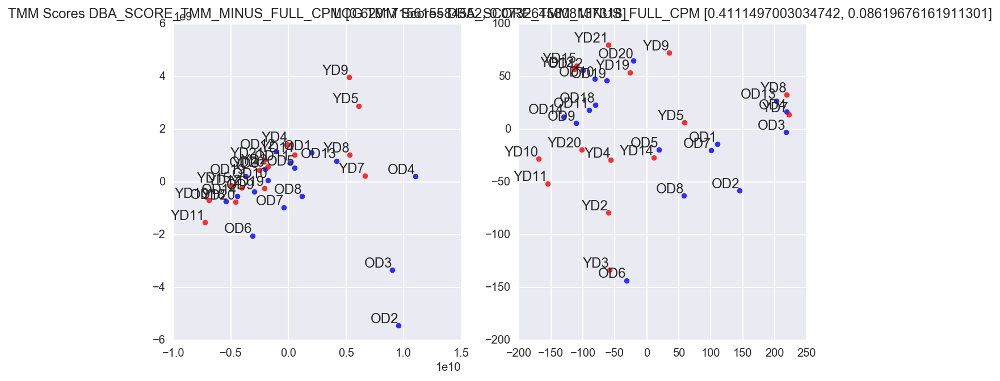

TMM Scores DBA_SCORE_TMM_MINUS_FULL


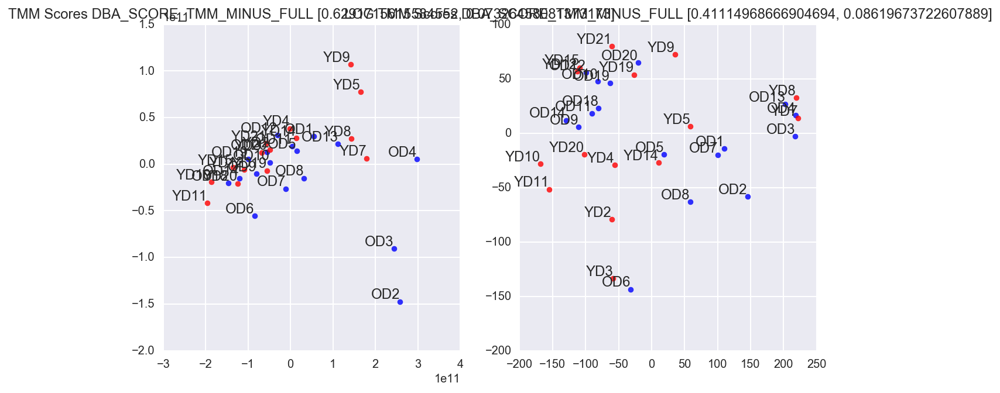

In [5]:
pca_and_diffbind('/mnt/stripe/bio/experiments/configs/Y20O20', 'H3K27ac')

Processing signal data
/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K27me3/coverages_150/peaks/peaks_raw.tsv


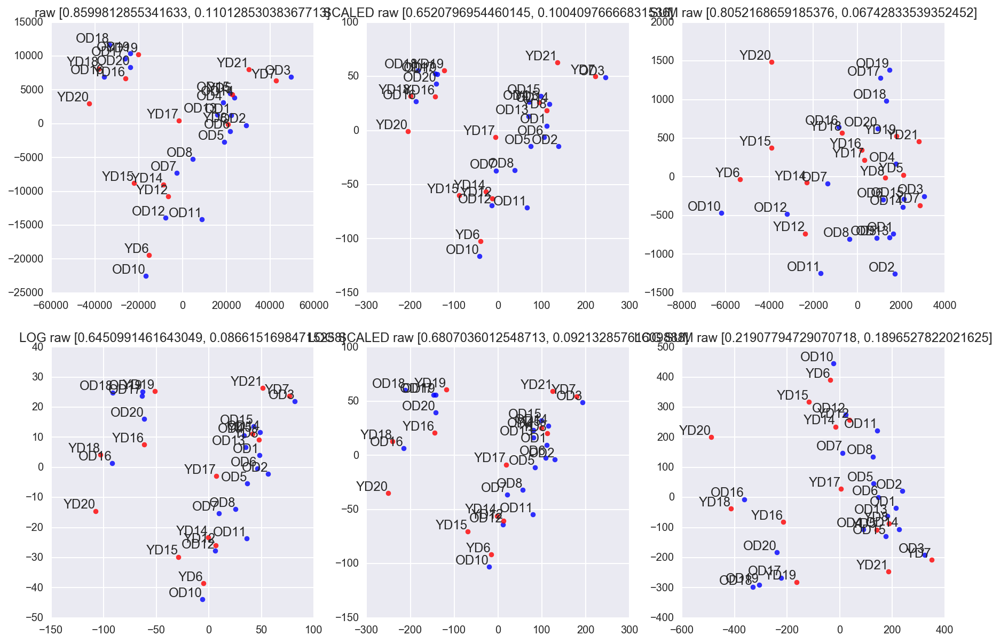

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K27me3/coverages_150/peaks/peaks_rpm.tsv


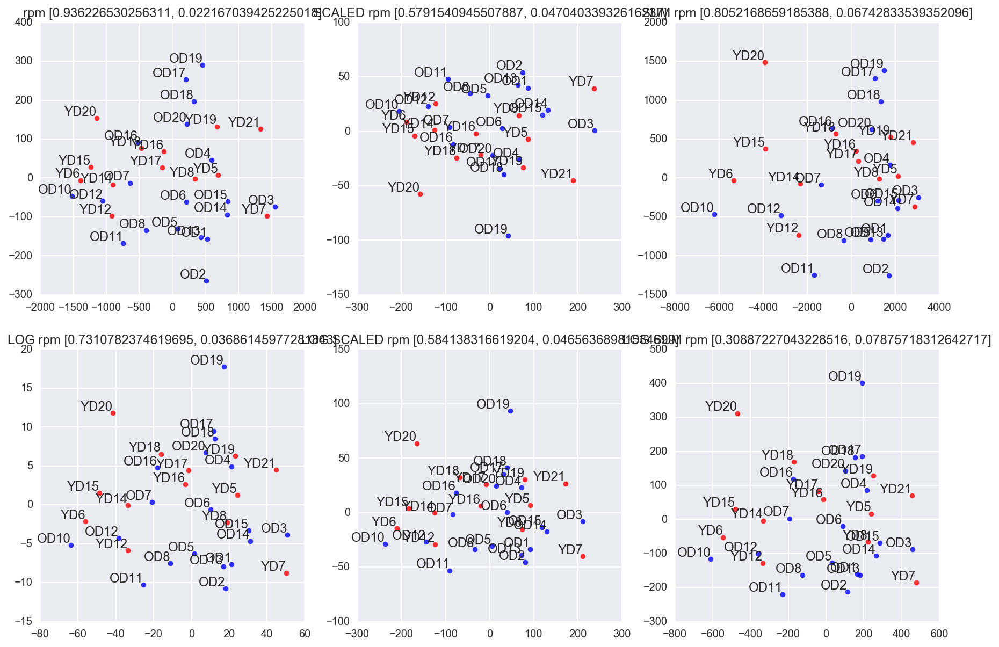

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K27me3/coverages_150/peaks/peaks_rpkm.tsv


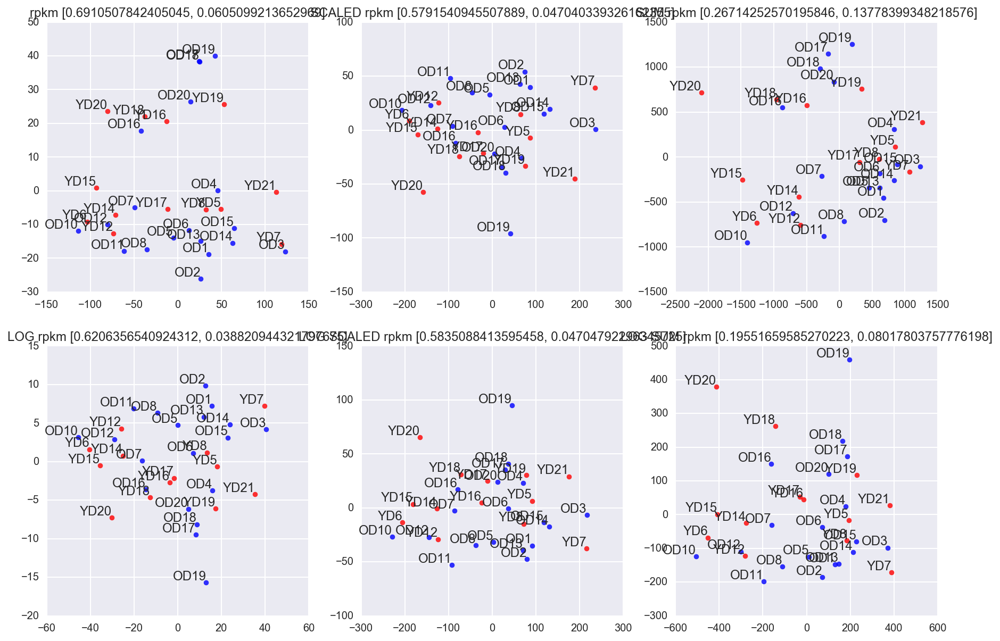

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K27me3/coverages_150/peaks/peaks_rpm_peaks.tsv


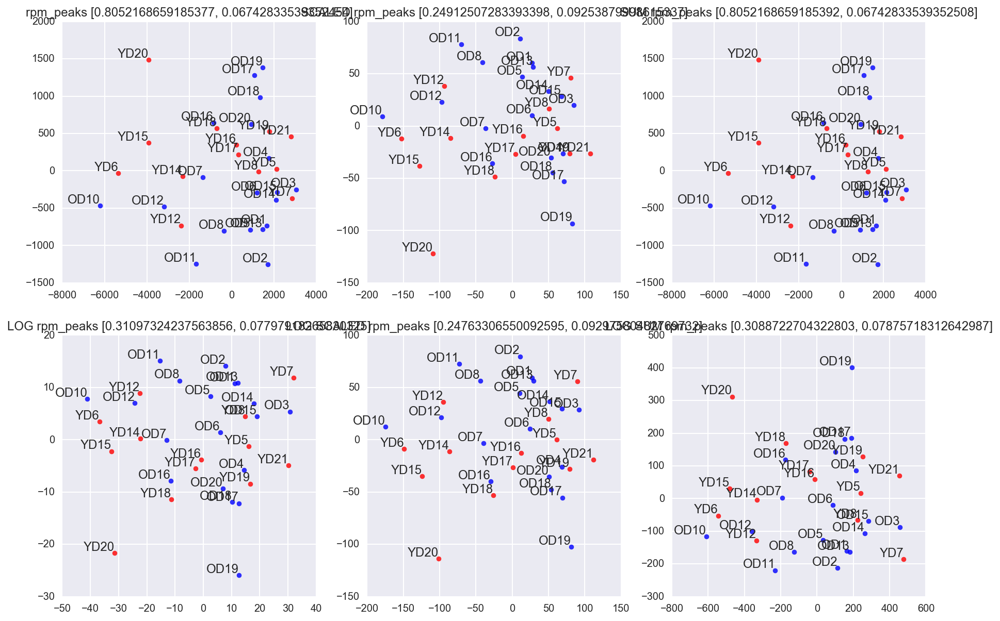

Processing diffbind normalization
OD_OD10_H3K27me3_unique size 39.664128 OD_input_unique size 39.506076 scale 1.00400070106
OD_OD11_H3K27me3_unique size 37.542434 OD_input_unique size 39.506076 scale 0.950295190036
OD_OD12_H3K27me3_unique size 34.66333 OD_input_unique size 39.506076 scale 0.877417691395
OD_OD13_H3K27me3_unique size 26.50433 OD_input_unique size 39.506076 scale 0.67089249765
OD_OD14_H3K27me3_unique size 25.776755 OD_input_unique size 39.506076 scale 0.652475710319
OD_OD15_H3K27me3_unique size 25.301633 OD_input_unique size 39.506076 scale 0.640449155213
OD_OD16_H3K27me3_unique size 15.27229 OD_input_unique size 39.506076 scale 0.386580788231
OD_OD17_H3K27me3_unique size 14.832744 OD_input_unique size 39.506076 scale 0.375454752833
OD_OD18_H3K27me3_unique size 12.07711 OD_input_unique size 39.506076 scale 0.305702596228
OD_OD19_H3K27me3_unique size 14.435251 OD_input_unique size 39.506076 scale 0.365393186608
OD_OD1_H3K27me3_unique size 27.596007 OD_input_unique size 39.

/Users/oleg/miniconda3/lib/python3.5/site-packages/sklearn/preprocessing/data.py:184: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


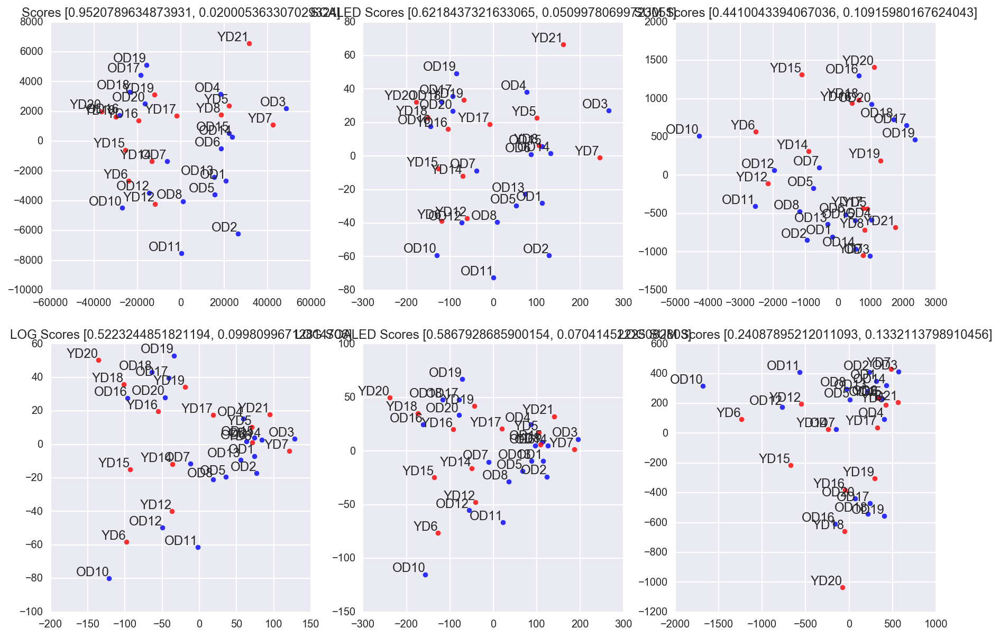

TMM normalization
Saved scores to /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores45m_6ffs.tsv
Saved sizes to /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/sizesmpo_lf4l.tsv
TMM normalization using R
Rscript /home/oleg/work/washu/R/tmm.R /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores45m_6ffs.tsv /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/sizesmpo_lf4l.tsv /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores45m_6ffs_tmm.tsv
TMM Scores DBA_SCORE_TMM_MINUS_FULL_CPM


,OD_OD10_H3K27me3_unique,OD_OD11_H3K27me3_unique,OD_OD12_H3K27me3_unique,OD_OD13_H3K27me3_unique,OD_OD14_H3K27me3_unique,OD_OD15_H3K27me3_unique,OD_OD16_H3K27me3_unique,OD_OD17_H3K27me3_unique,OD_OD18_H3K27me3_unique,OD_OD19_H3K27me3_unique,...,YD_YD16_H3K27me3_unique,YD_YD17_H3K27me3_unique,YD_YD18_H3K27me3_unique,YD_YD19_H3K27me3_unique,YD_YD20_H3K27me3_unique,YD_YD21_H3K27me3_unique,YD_YD5_H3K27me3_unique,YD_YD6_H3K27me3_unique,YD_YD7_H3K27me3_unique,YD_YD8_H3K27me3_unique
0,6.839666e+05,2.891292e+07,2.533067e+07,3.544300e+07,2.950953e+07,3.946178e+07,3.264279e+07,4.282019e+07,3.040013e+07,4.093973e+07,...,2.904408e+07,3.965674e+07,3.492951e+07,3.927292e+07,2.577669e+07,4.019185e+07,4.231745e+07,3.560654e+07,3.470457e+07,3.379341e+07
1,6.839666e+05,7.710112e+05,4.135620e+06,3.248942e+06,3.251050e+06,2.630785e+06,7.772094e+05,1.690270e+06,2.533344e+06,5.458630e+06,...,1.778209e+06,7.852821e+05,2.436942e+06,2.040151e+06,4.124271e+06,2.787874e+06,2.170126e+06,2.543325e+06,4.026497e+06,1.064359e+06
2,6.839666e+05,3.855056e+05,5.169525e+05,5.611809e+06,2.650856e+07,9.470827e+06,4.663256e+06,7.887929e+06,2.153343e+07,2.893074e+07,...,1.718936e+07,1.452772e+07,8.935456e+06,6.630492e+06,7.217474e+06,7.898976e+06,2.549898e+07,6.358311e+05,8.052995e+06,2.687508e+07
3,6.839666e+05,1.619123e+07,1.602553e+07,2.717297e+07,3.451115e+07,2.814940e+07,2.564791e+07,4.845442e+07,2.660012e+07,4.912767e+07,...,2.726587e+07,4.436844e+07,2.518174e+07,3.519261e+07,4.949125e+07,3.438378e+07,3.390822e+07,2.161826e+07,1.879032e+07,3.006815e+07
4,2.735867e+06,1.349270e+08,1.013227e+08,1.730800e+08,1.810585e+08,2.344030e+08,2.207275e+08,2.749507e+08,2.514344e+08,3.155088e+08,...,1.938248e+08,1.986764e+08,2.112017e+08,2.310471e+08,1.732194e+08,2.625248e+08,2.170126e+08,5.595314e+07,2.005579e+08,1.921169e+08


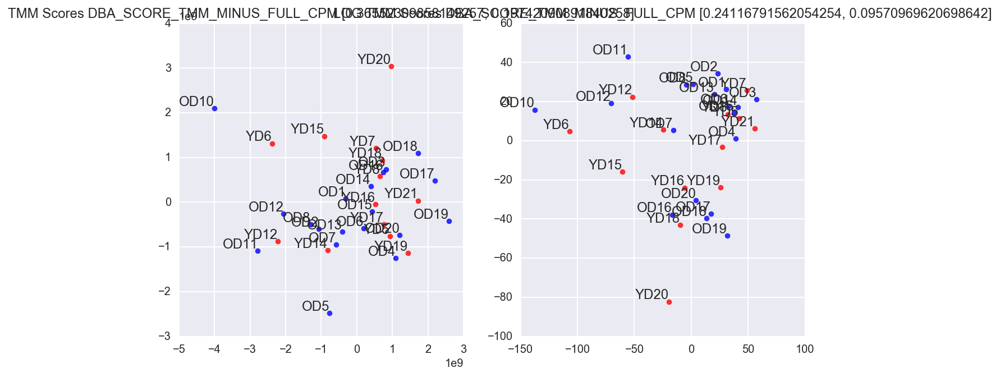

TMM Scores DBA_SCORE_TMM_MINUS_FULL


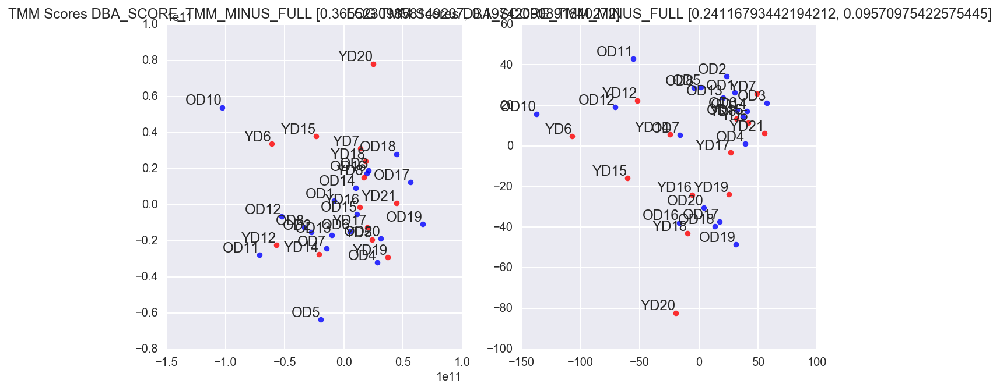

In [6]:
pca_and_diffbind('/mnt/stripe/bio/experiments/configs/Y20O20', 'H3K27me3')

Processing signal data
/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K36me3/coverages_150/peaks/peaks_raw.tsv


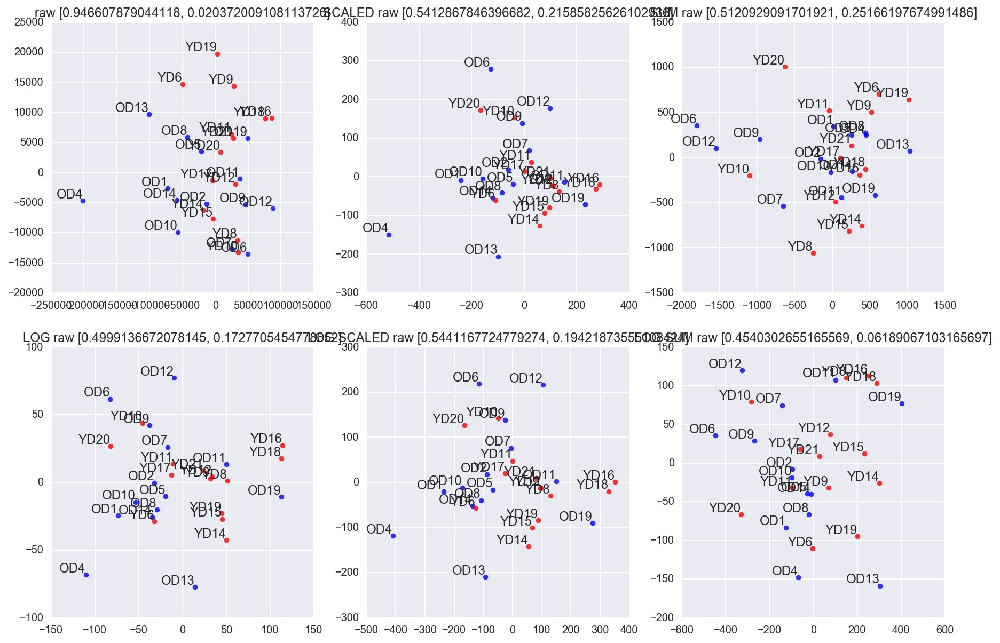

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K36me3/coverages_150/peaks/peaks_rpm.tsv


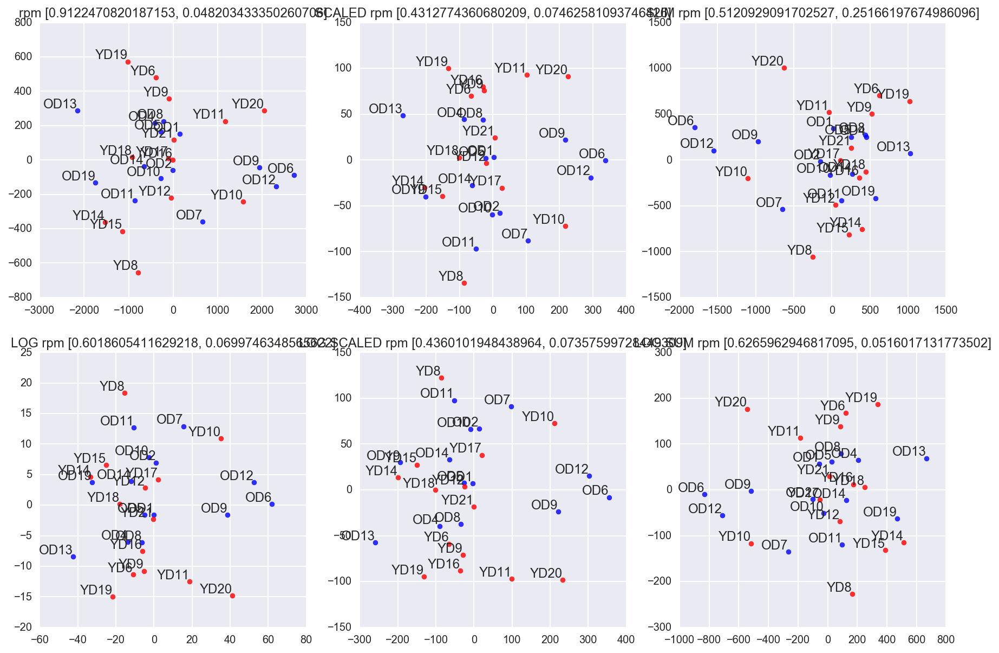

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K36me3/coverages_150/peaks/peaks_rpkm.tsv


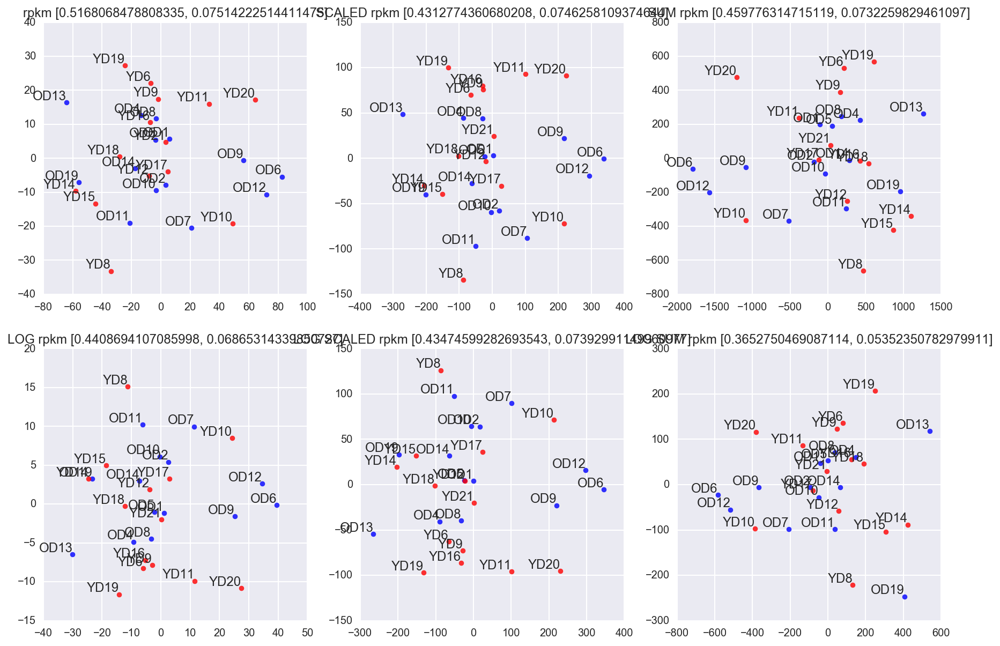

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K36me3/coverages_150/peaks/peaks_rpm_peaks.tsv


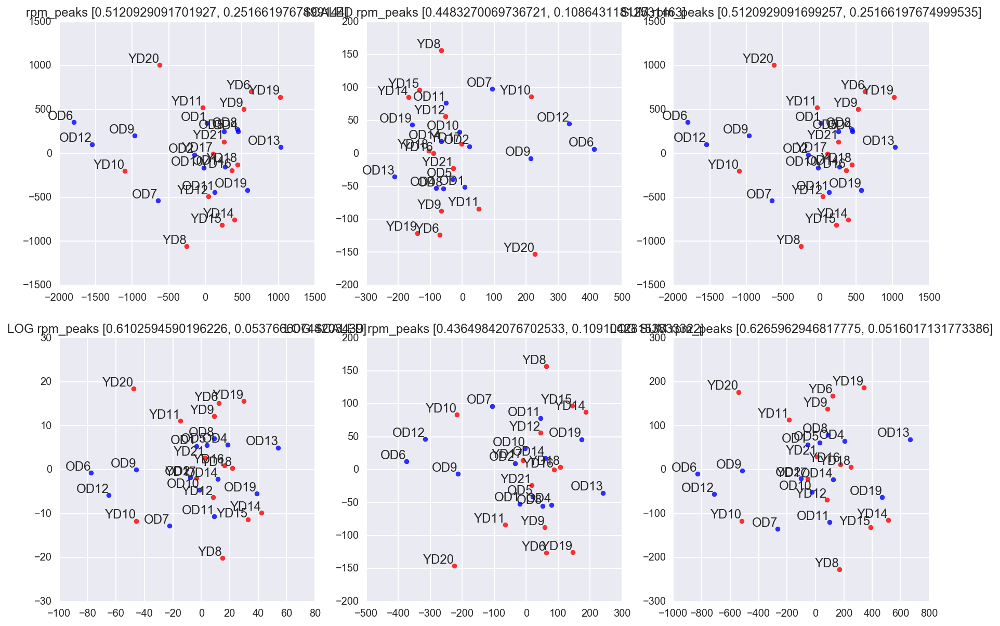

Processing diffbind normalization
OD_OD10_H3K36me3_unique size 43.165005 OD_input_unique size 39.506076 scale 1.09261686734
OD_OD11_H3K36me3_unique size 26.525561 OD_input_unique size 39.506076 scale 0.671429908655
OD_OD12_H3K36me3_unique size 34.817488 OD_input_unique size 39.506076 scale 0.881319825335
OD_OD13_H3K36me3_unique size 38.843604 OD_input_unique size 39.506076 scale 0.983231136395
OD_OD14_H3K36me3_unique size 41.059358 OD_input_unique size 39.506076 scale 1.039317547
OD_OD19_H3K36me3_unique size 22.089416 OD_input_unique size 39.506076 scale 0.559139713091
OD_OD1_H3K36me3_unique size 48.560303 OD_input_unique size 39.506076 scale 1.22918568273
OD_OD2_H3K36me3_unique size 38.010853 OD_input_unique size 39.506076 scale 0.962152075038
OD_OD4_H3K36me3_unique size 63.828393 OD_input_unique size 39.506076 scale 1.6156601582
OD_OD5_H3K36me3_unique size 37.659149 OD_input_unique size 39.506076 scale 0.953249545715
OD_OD6_H3K36me3_unique size 49.542509 OD_input_unique size 39.50607

/Users/oleg/miniconda3/lib/python3.5/site-packages/sklearn/preprocessing/data.py:184: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


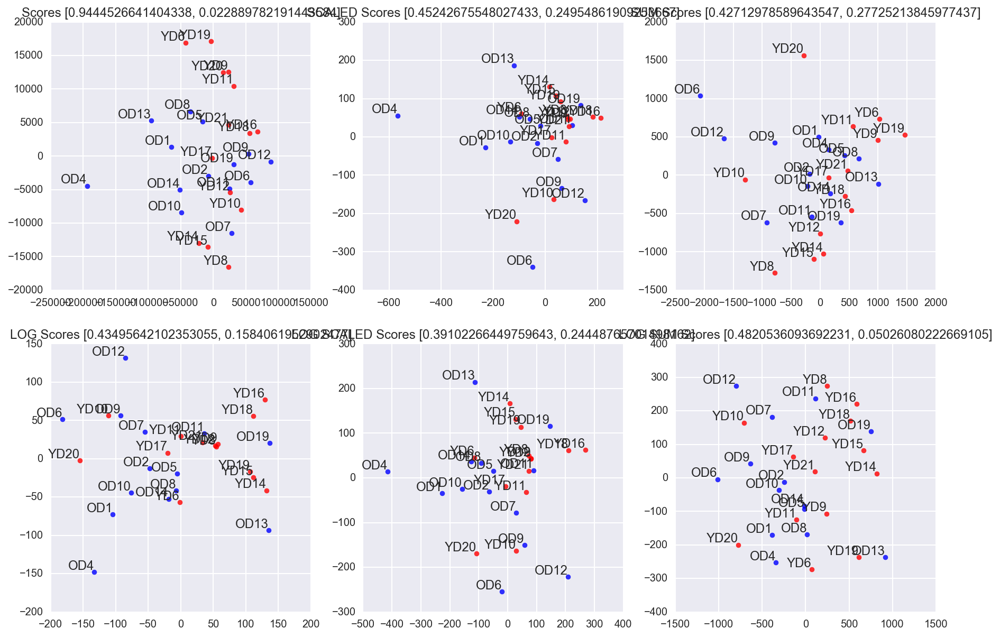

TMM normalization
Saved scores to /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores1dw3a35_.tsv
Saved sizes to /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/sizessn6hbgxc.tsv
TMM normalization using R
Rscript /home/oleg/work/washu/R/tmm.R /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores1dw3a35_.tsv /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/sizessn6hbgxc.tsv /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores1dw3a35__tmm.tsv
TMM Scores DBA_SCORE_TMM_MINUS_FULL_CPM


,OD_OD10_H3K36me3_unique,OD_OD11_H3K36me3_unique,OD_OD12_H3K36me3_unique,OD_OD13_H3K36me3_unique,OD_OD14_H3K36me3_unique,OD_OD19_H3K36me3_unique,OD_OD1_H3K36me3_unique,OD_OD2_H3K36me3_unique,OD_OD4_H3K36me3_unique,OD_OD5_H3K36me3_unique,...,YD_YD15_H3K36me3_unique,YD_YD16_H3K36me3_unique,YD_YD17_H3K36me3_unique,YD_YD18_H3K36me3_unique,YD_YD19_H3K36me3_unique,YD_YD20_H3K36me3_unique,YD_YD21_H3K36me3_unique,YD_YD6_H3K36me3_unique,YD_YD8_H3K36me3_unique,YD_YD9_H3K36me3_unique
0,1.051261e+07,1.141460e+07,3.655088e+05,1.222421e+07,5.381304e+06,1.469489e+07,3.570734e+06,2.745578e+06,6.973881e+06,4.951875e+06,...,5.084048e+06,1.557615e+07,6.784088e+06,5.956399e+06,1.199623e+07,1.967412e+05,7.000599e+06,5.759063e+06,7.774888e+06,6.744227e+06
1,5.977759e+06,8.301526e+06,6.944667e+06,8.868548e+06,6.278188e+06,7.755637e+06,6.605858e+06,4.243166e+06,4.771603e+06,6.515625e+06,...,1.239237e+07,1.713376e+07,8.762781e+06,8.705506e+06,7.781339e+06,4.131564e+06,1.033422e+07,7.371601e+06,8.450965e+06,5.395382e+06
2,2.803363e+07,2.317509e+07,2.558562e+07,1.701802e+07,2.242210e+07,4.122733e+07,2.803026e+07,2.695658e+07,2.385801e+07,2.840812e+07,...,2.383147e+07,5.451652e+07,2.685368e+07,2.061830e+07,1.945335e+07,1.573929e+06,2.133516e+07,1.566465e+07,3.008544e+07,1.652336e+07
3,1.174939e+07,1.937023e+07,6.944667e+06,2.205152e+07,1.569547e+07,1.142936e+07,9.105373e+06,1.347829e+07,1.211253e+07,1.329187e+07,...,1.652316e+07,1.817217e+07,1.130681e+07,1.008006e+07,1.199623e+07,2.754376e+06,1.066758e+07,1.382175e+07,1.893016e+07,1.247682e+07
4,2.135503e+08,2.549260e+08,1.286591e+08,2.727678e+08,2.269117e+08,3.090009e+08,1.772870e+08,2.126575e+08,1.984497e+08,2.032875e+08,...,3.660514e+08,2.497376e+08,2.108721e+08,2.822417e+08,1.945335e+08,8.440196e+07,1.836824e+08,1.566465e+08,3.441233e+08,2.141292e+08


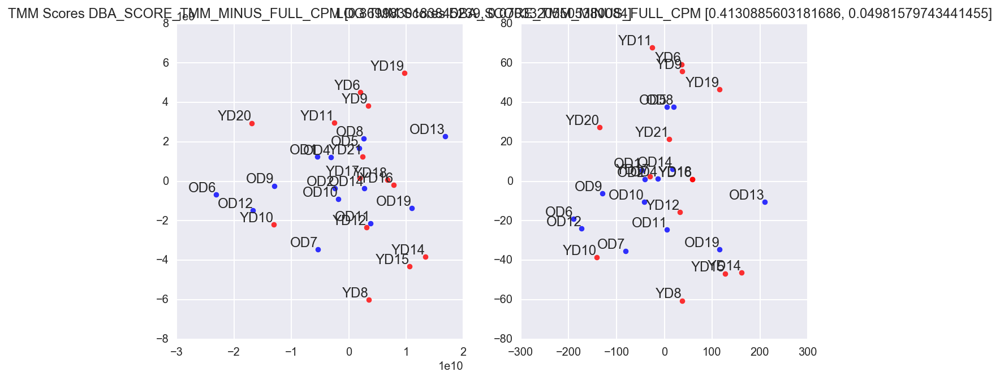

TMM Scores DBA_SCORE_TMM_MINUS_FULL


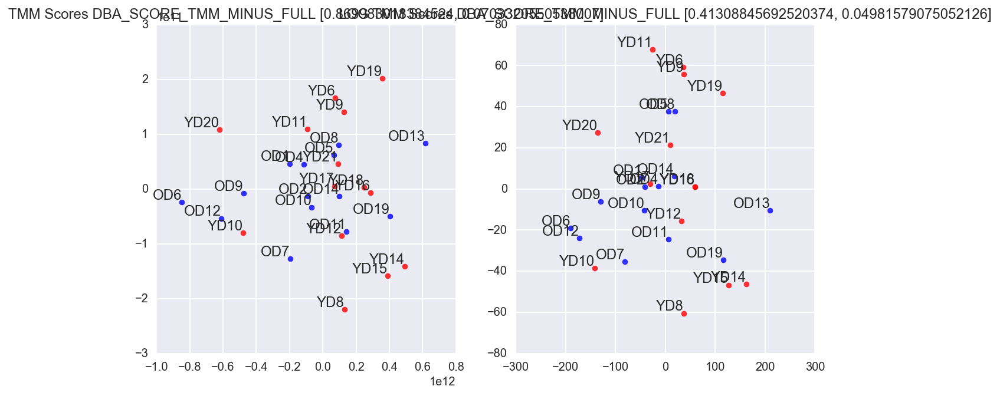

In [7]:
pca_and_diffbind('/mnt/stripe/bio/experiments/configs/Y20O20', 'H3K36me3')

Processing signal data
/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K4me1/coverages_150/peaks/peaks_raw.tsv


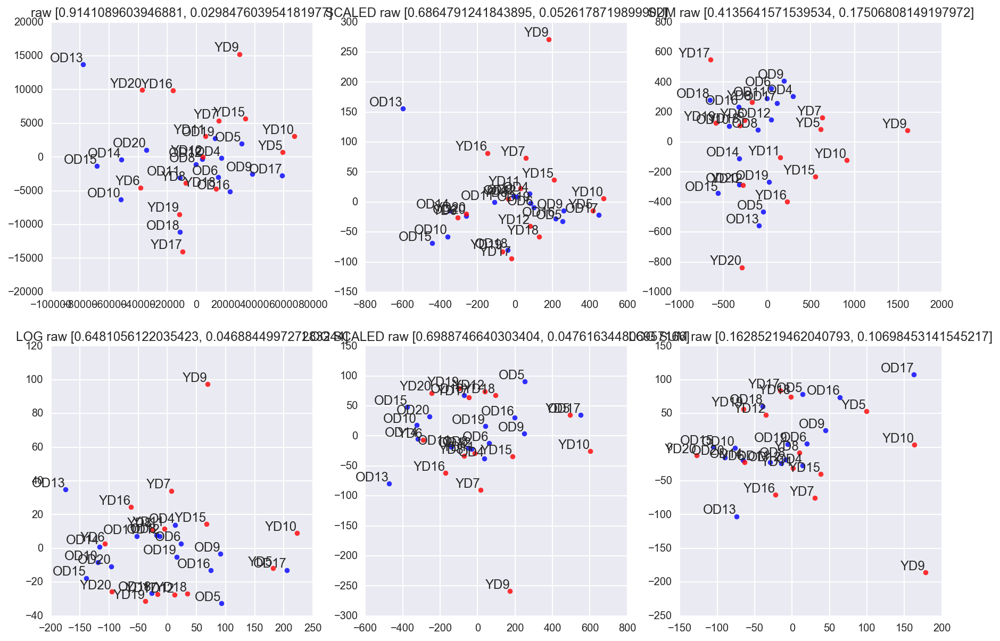

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K4me1/coverages_150/peaks/peaks_rpm.tsv


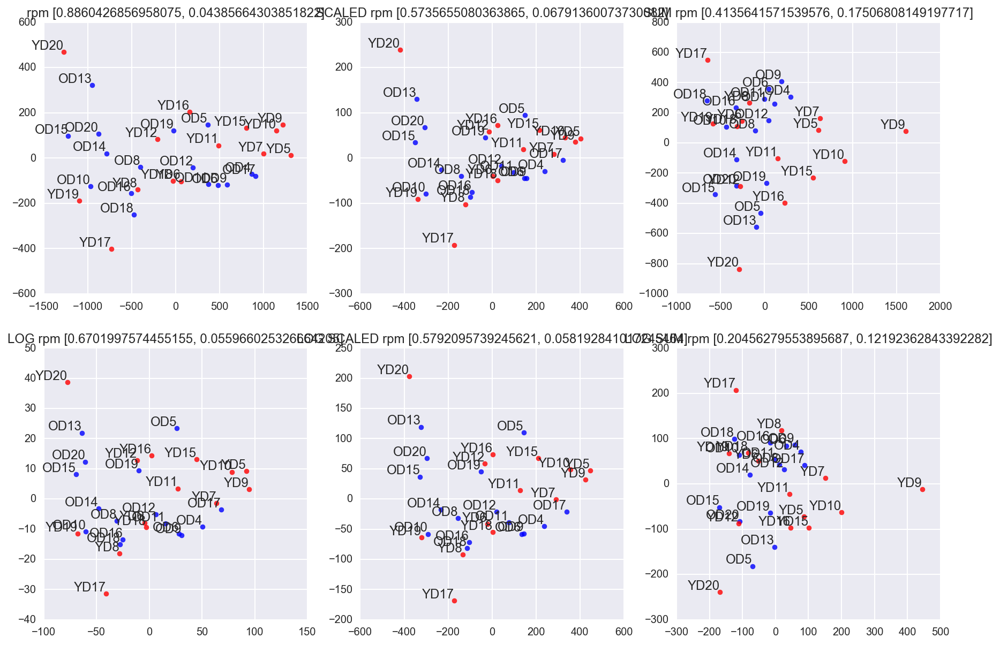

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K4me1/coverages_150/peaks/peaks_rpkm.tsv


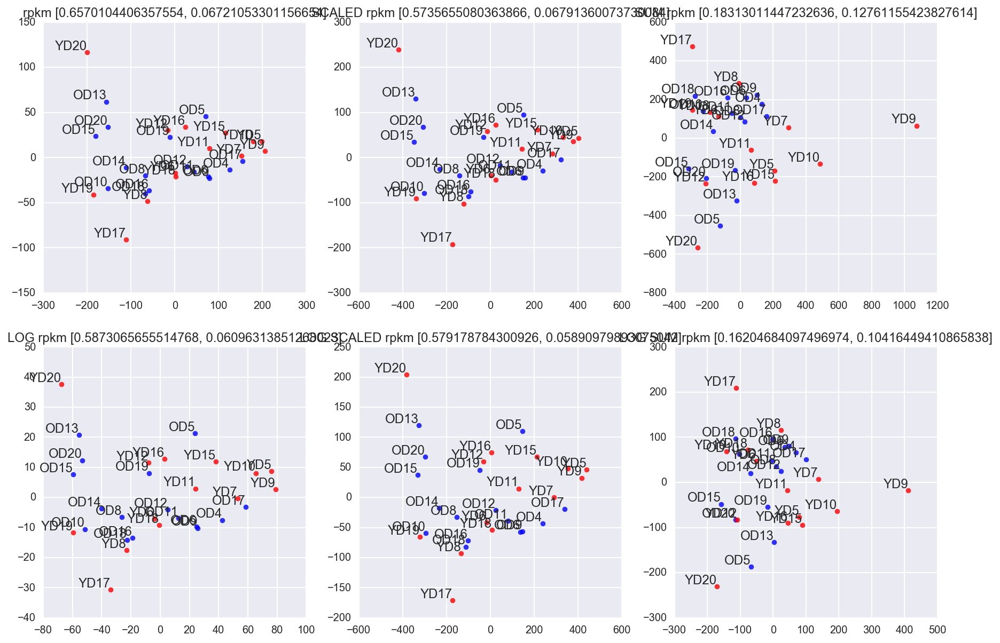

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K4me1/coverages_150/peaks/peaks_rpm_peaks.tsv


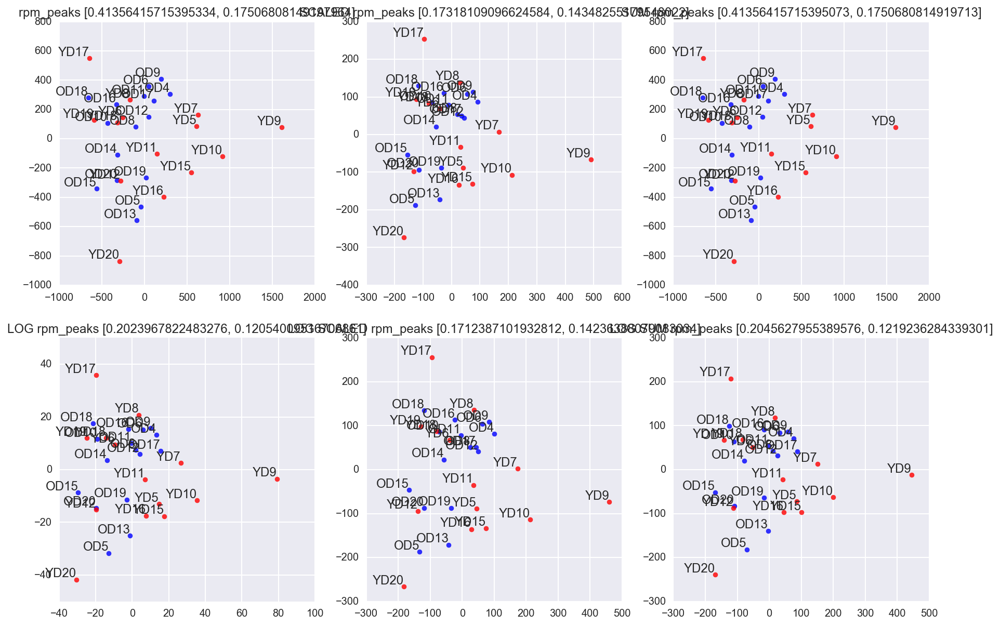

Processing diffbind normalization
OD_OD10_H3K4me1_unique size 40.680137 OD_input_unique size 39.506076 scale 1.02971849191
OD_OD11_H3K4me1_unique size 45.602131 OD_input_unique size 39.506076 scale 1.15430677043
OD_OD12_H3K4me1_unique size 37.78309 OD_input_unique size 39.506076 scale 0.956386809968
OD_OD13_H3K4me1_unique size 46.922517 OD_input_unique size 39.506076 scale 1.18772912298
OD_OD14_H3K4me1_unique size 42.468539 OD_input_unique size 39.506076 scale 1.0749875285
OD_OD15_H3K4me1_unique size 42.095807 OD_input_unique size 39.506076 scale 1.06555272662
OD_OD16_H3K4me1_unique size 25.462198 OD_input_unique size 39.506076 scale 0.644513466739
OD_OD17_H3K4me1_unique size 25.569208 OD_input_unique size 39.506076 scale 0.647222164003
OD_OD18_H3K4me1_unique size 35.296835 OD_input_unique size 39.506076 scale 0.893453326015
OD_OD19_H3K4me1_unique size 32.403931 OD_input_unique size 39.506076 scale 0.820226514018
OD_OD20_H3K4me1_unique size 37.286665 OD_input_unique size 39.506076 scal

/Users/oleg/miniconda3/lib/python3.5/site-packages/sklearn/preprocessing/data.py:184: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


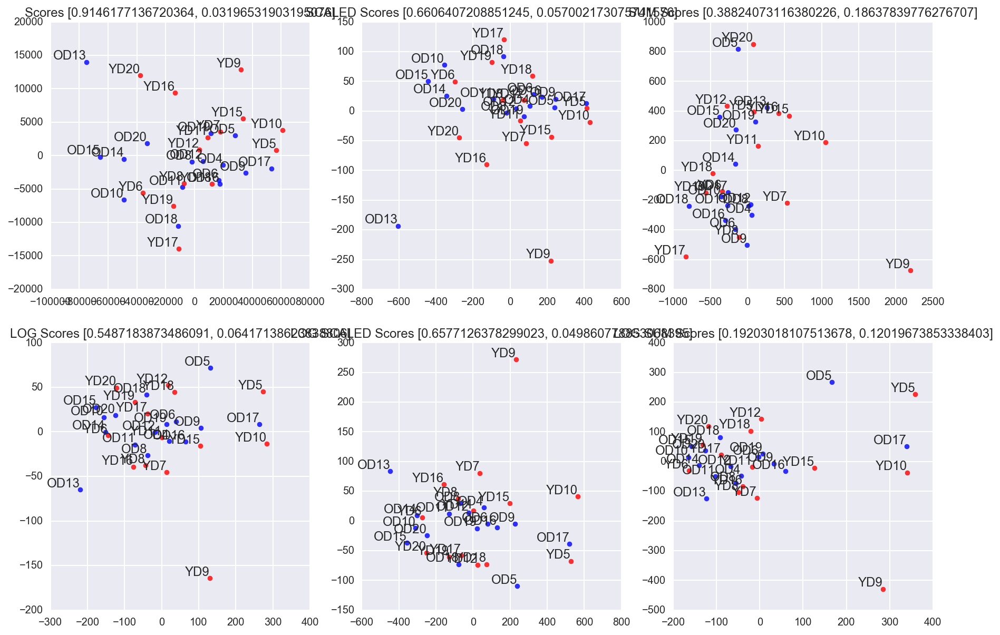

TMM normalization
Saved scores to /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores2r9uxvu2.tsv
Saved sizes to /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/sizes6srn3wo0.tsv
TMM normalization using R
Rscript /home/oleg/work/washu/R/tmm.R /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores2r9uxvu2.tsv /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/sizes6srn3wo0.tsv /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores2r9uxvu2_tmm.tsv
TMM Scores DBA_SCORE_TMM_MINUS_FULL_CPM


,OD_OD10_H3K4me1_unique,OD_OD11_H3K4me1_unique,OD_OD12_H3K4me1_unique,OD_OD13_H3K4me1_unique,OD_OD14_H3K4me1_unique,OD_OD15_H3K4me1_unique,OD_OD16_H3K4me1_unique,OD_OD17_H3K4me1_unique,OD_OD18_H3K4me1_unique,OD_OD19_H3K4me1_unique,...,YD_YD16_H3K4me1_unique,YD_YD17_H3K4me1_unique,YD_YD18_H3K4me1_unique,YD_YD19_H3K4me1_unique,YD_YD20_H3K4me1_unique,YD_YD5_H3K4me1_unique,YD_YD6_H3K4me1_unique,YD_YD7_H3K4me1_unique,YD_YD8_H3K4me1_unique,YD_YD9_H3K4me1_unique
0,3.572252e+06,5.405179e+06,4.011182e+06,1.637570e+06,2.739053e+06,2.353533e+06,3.055108e+06,2.567498e+06,3.454858e+06,1.722615e+06,...,3.033140e+06,2.499950e+06,4.993798e+06,1.817114e+06,2.810881e+06,5.201412e+06,3.227652e+06,4.390106e+06,4.367948e+06,4.510187e+06
1,3.061930e+06,5.405179e+06,6.685303e+06,4.639782e+06,5.649297e+06,4.393262e+06,5.431303e+06,6.418745e+06,4.441960e+06,6.029154e+06,...,4.766364e+06,5.499890e+06,5.305910e+06,2.725670e+06,5.434370e+06,3.250882e+06,4.303536e+06,4.975453e+06,4.610612e+06,6.560272e+06
2,1.020643e+06,9.008631e+05,2.674121e+05,2.729283e+05,8.559541e+05,1.882827e+06,3.394564e+06,3.851247e+06,7.403266e+05,3.732334e+06,...,2.599835e+06,2.749945e+06,1.248449e+06,9.085568e+05,3.373057e+06,6.501765e+05,2.331082e+06,5.853474e+05,4.853276e+05,2.050085e+06
3,1.275804e+07,1.576510e+07,1.256837e+07,1.719448e+07,1.455122e+07,1.663164e+07,1.867010e+07,1.925623e+07,7.403266e+06,2.124559e+07,...,1.711558e+07,1.874963e+07,1.217238e+07,1.453691e+07,1.798964e+07,1.235335e+07,1.667620e+07,1.404834e+07,1.358917e+07,1.804075e+07
4,1.445911e+07,1.351295e+07,1.310319e+07,1.555691e+07,1.455122e+07,1.270908e+07,1.255989e+07,1.026999e+07,3.208082e+06,1.894877e+07,...,1.624897e+07,1.224976e+07,1.248449e+07,1.067554e+07,1.555354e+07,1.365371e+07,1.219335e+07,1.287764e+07,1.334651e+07,1.394058e+07


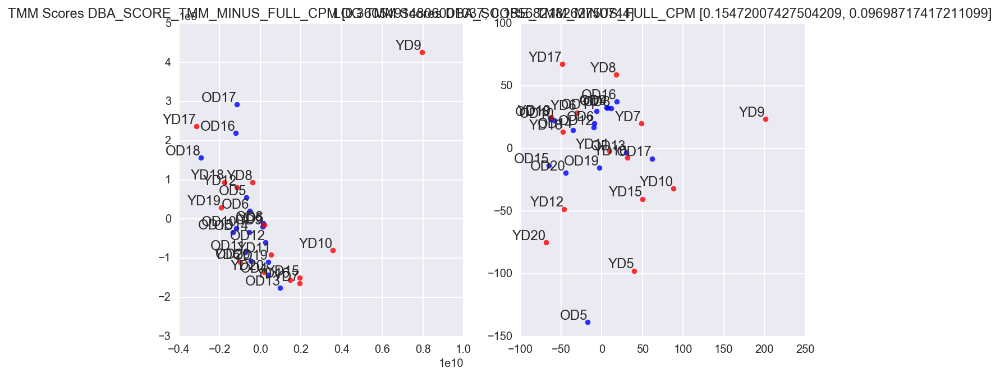

TMM Scores DBA_SCORE_TMM_MINUS_FULL


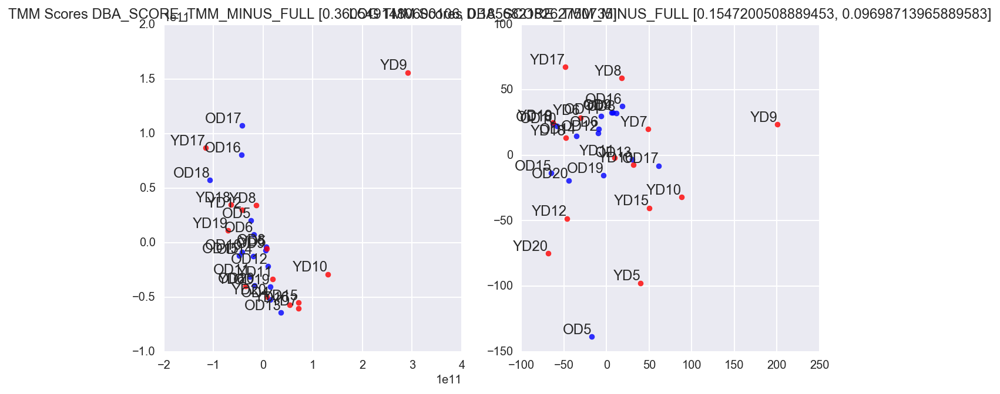

In [8]:
pca_and_diffbind('/mnt/stripe/bio/experiments/configs/Y20O20', 'H3K4me1')

Processing signal data
/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K4me3/coverages_150/peaks/peaks_raw.tsv


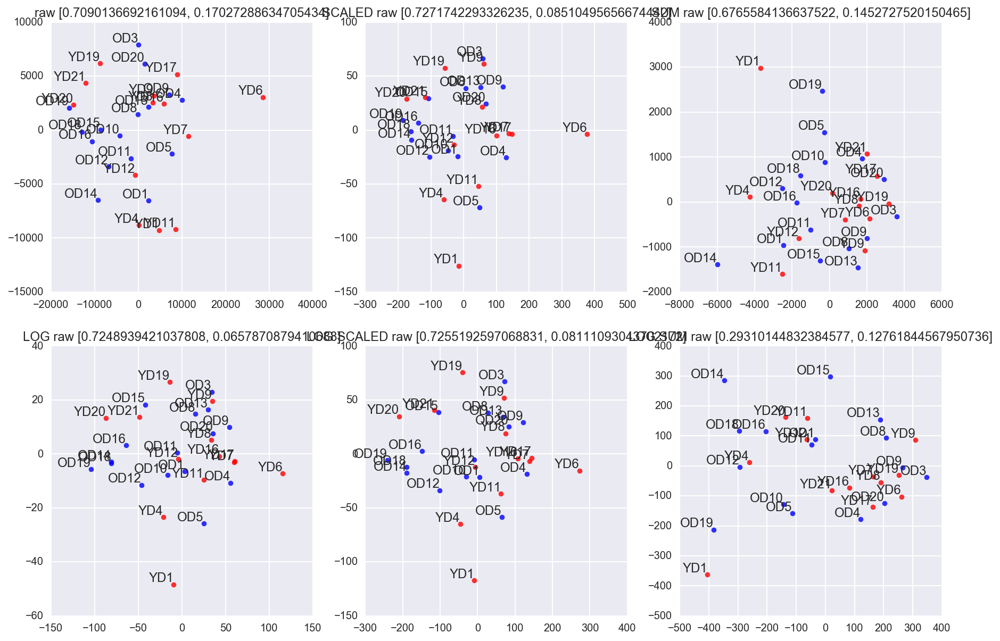

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K4me3/coverages_150/peaks/peaks_rpm.tsv


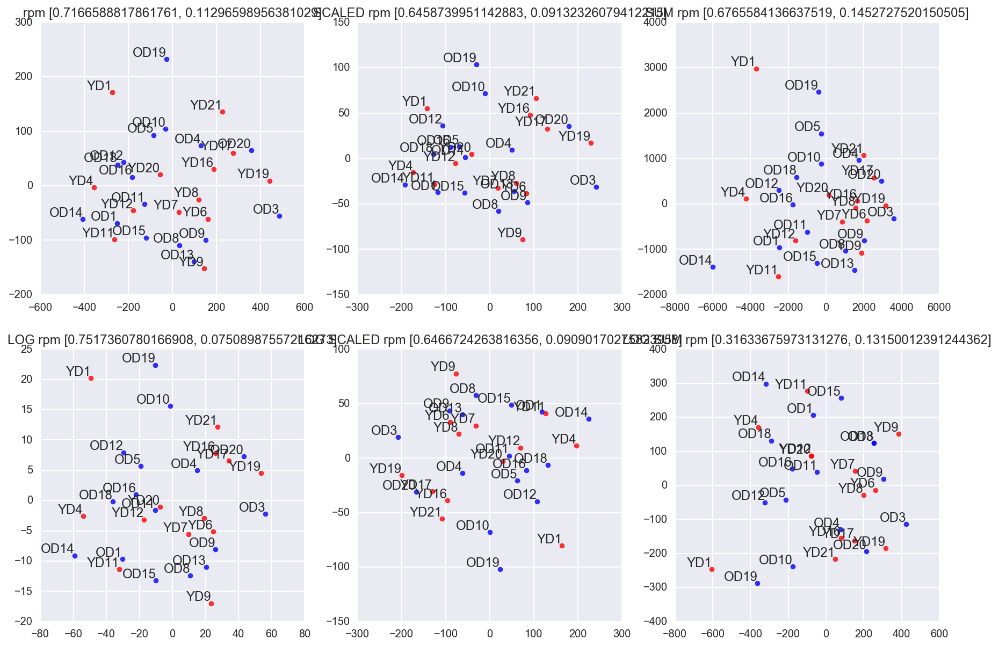

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K4me3/coverages_150/peaks/peaks_rpkm.tsv


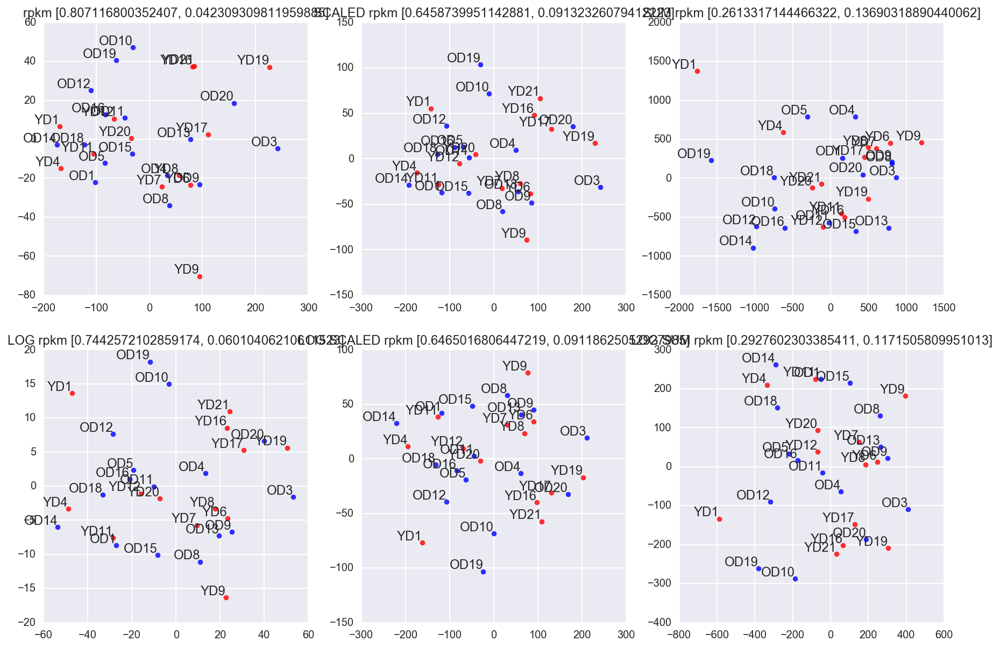

/mnt/stripe/bio/experiments/configs/Y20O20/signal/H3K4me3/coverages_150/peaks/peaks_rpm_peaks.tsv


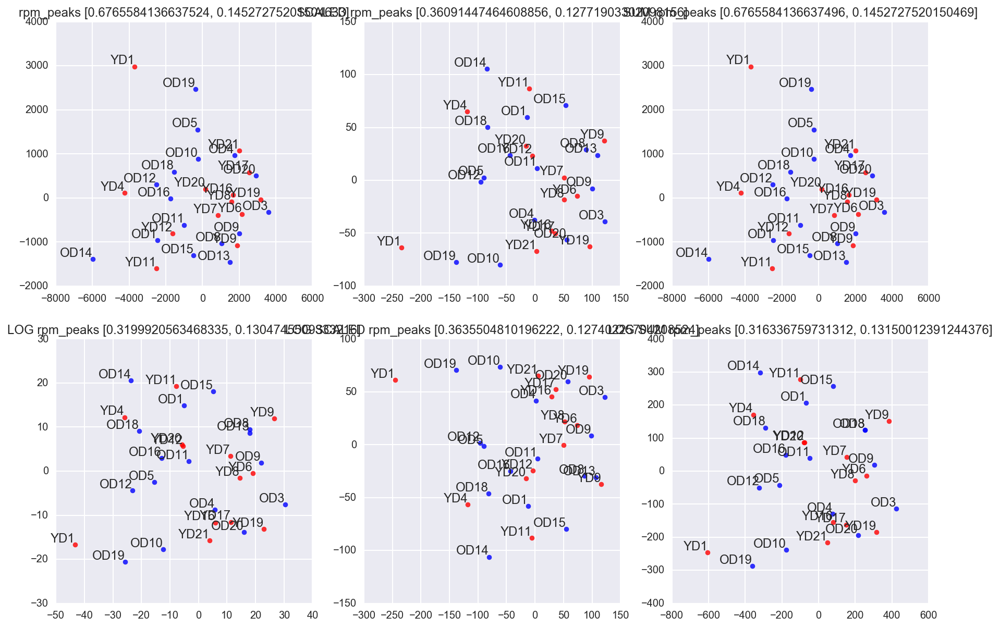

Processing diffbind normalization
OD_OD10_H3K4me3_unique size 24.402468 OD_input_unique size 39.506076 scale 0.61768898536
OD_OD11_H3K4me3_unique size 29.106909 OD_input_unique size 39.506076 scale 0.736770440071
OD_OD12_H3K4me3_unique size 25.922356 OD_input_unique size 39.506076 scale 0.656161244665
OD_OD13_H3K4me3_unique size 28.386023 OD_input_unique size 39.506076 scale 0.718522968467
OD_OD14_H3K4me3_unique size 28.019068 OD_input_unique size 39.506076 scale 0.709234397261
OD_OD15_H3K4me3_unique size 22.3083 OD_input_unique size 39.506076 scale 0.564680227922
OD_OD16_H3K4me3_unique size 21.1432 OD_input_unique size 39.506076 scale 0.535188561881
OD_OD18_H3K4me3_unique size 21.177198 OD_input_unique size 39.506076 scale 0.536049138365
OD_OD19_H3K4me3_unique size 13.656639 OD_input_unique size 39.506076 scale 0.345684522047
OD_OD1_H3K4me3_unique size 37.293544 OD_input_unique size 39.506076 scale 0.943995146468
OD_OD20_H3K4me3_unique size 23.446107 OD_input_unique size 39.506076 sca

/Users/oleg/miniconda3/lib/python3.5/site-packages/sklearn/preprocessing/data.py:184: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


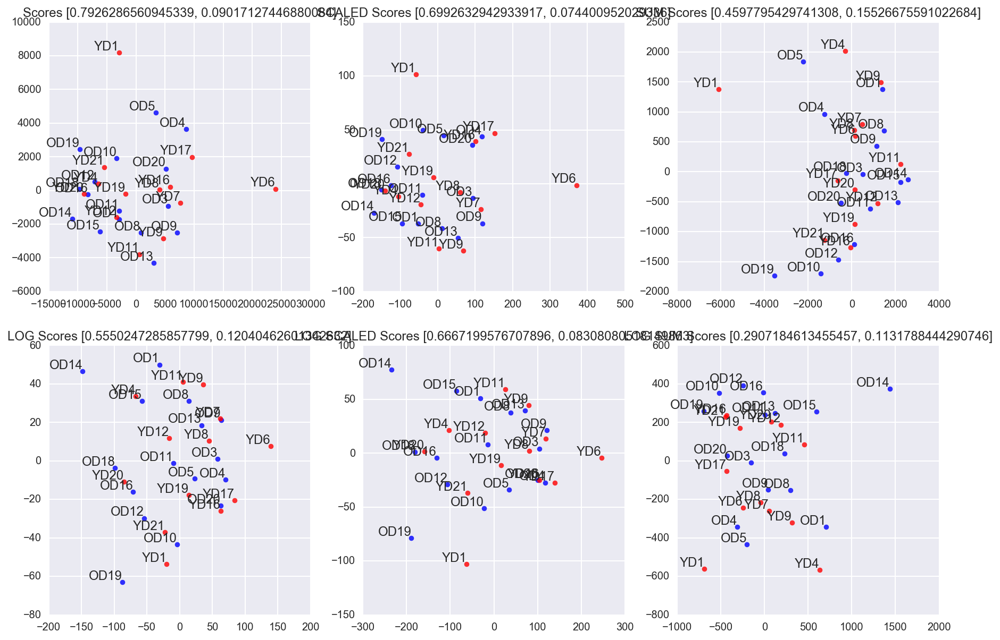

TMM normalization
Saved scores to /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores0ma4n66n.tsv
Saved sizes to /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/sizesj5zb2ex_.tsv
TMM normalization using R
Rscript /home/oleg/work/washu/R/tmm.R /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores0ma4n66n.tsv /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/sizesj5zb2ex_.tsv /var/folders/td/g2ws4hwj5tj48_j_tsfz8_tc0000gp/T/scores0ma4n66n_tmm.tsv
TMM Scores DBA_SCORE_TMM_MINUS_FULL_CPM


,OD_OD10_H3K4me3_unique,OD_OD11_H3K4me3_unique,OD_OD12_H3K4me3_unique,OD_OD13_H3K4me3_unique,OD_OD14_H3K4me3_unique,OD_OD15_H3K4me3_unique,OD_OD16_H3K4me3_unique,OD_OD18_H3K4me3_unique,OD_OD19_H3K4me3_unique,OD_OD1_H3K4me3_unique,...,YD_YD17_H3K4me3_unique,YD_YD19_H3K4me3_unique,YD_YD1_H3K4me3_unique,YD_YD20_H3K4me3_unique,YD_YD21_H3K4me3_unique,YD_YD4_H3K4me3_unique,YD_YD6_H3K4me3_unique,YD_YD7_H3K4me3_unique,YD_YD8_H3K4me3_unique,YD_YD9_H3K4me3_unique
0,8.346666e+06,5.781550e+06,3.288437e+06,5.226786e+06,9.320345e+06,4.915173e+06,7.216375e+06,7.373680e+06,5.949323e+06,6.095984e+06,...,4.791930e+06,4.843748e+06,4.650042e+05,6.765477e+06,3.238335e+06,4.781030e+06,5.803790e+06,5.764405e+06,5.606271e+06,6.373760e+06
1,8.744127e+06,1.002135e+07,7.673019e+06,8.527915e+06,3.389216e+06,9.338829e+06,8.419104e+06,7.373680e+05,1.041132e+07,6.908782e+06,...,9.366046e+06,9.341515e+06,1.395013e+06,8.118572e+06,7.864529e+06,3.718579e+06,8.918019e+06,8.646608e+06,7.007838e+06,1.080768e+07
2,5.723428e+07,2.042814e+07,3.946124e+07,1.650564e+07,8.473041e+05,1.130490e+07,7.817740e+06,1.032315e+07,4.164526e+07,4.063990e+05,...,3.049410e+07,2.906249e+07,3.580533e+07,1.759024e+07,3.700955e+07,2.656128e+06,2.307360e+07,1.945487e+07,2.186446e+07,8.867840e+06
3,7.949206e+05,3.083493e+06,5.480728e+05,1.375470e+06,8.473041e+05,2.949104e+06,6.013646e+05,2.212104e+06,7.436654e+06,4.063990e+05,...,2.831595e+06,1.729910e+06,3.720034e+06,6.765477e+05,1.387858e+06,5.312256e+05,9.908909e+05,2.401835e+05,2.803135e+05,8.313600e+05
4,3.139936e+07,1.580290e+07,1.808640e+07,1.017848e+07,8.473041e+05,6.389725e+06,2.044640e+07,1.843420e+07,3.197761e+07,2.844793e+06,...,1.698957e+07,1.764508e+07,3.487532e+07,1.691369e+07,1.757954e+07,6.374707e+06,1.330625e+07,1.272973e+07,1.149285e+07,8.036480e+06


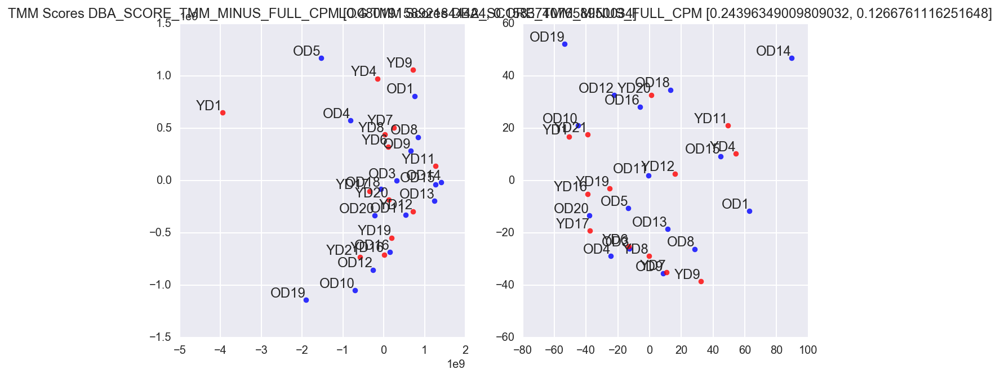

TMM Scores DBA_SCORE_TMM_MINUS_FULL


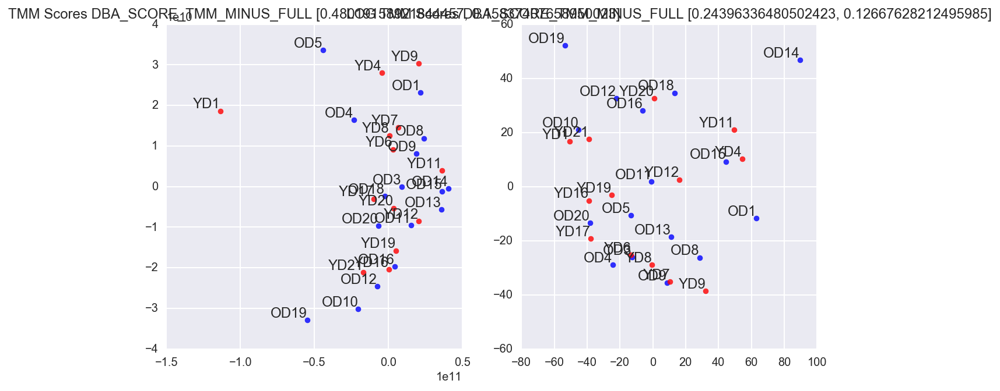

In [9]:
pca_and_diffbind('/mnt/stripe/bio/experiments/configs/Y20O20', 'H3K4me3')